In [67]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/amex-default-prediction/sample_submission.csv
/kaggle/input/amex-default-prediction/train_data.csv
/kaggle/input/amex-default-prediction/test_data.csv
/kaggle/input/amex-default-prediction/train_labels.csv


In [68]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_validate
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [69]:
pd.set_option('display.max_columns', None)

In [70]:
df_train = pd.read_csv('/kaggle/input/amex-default-prediction/train_data.csv', skiprows=lambda i: i>0 and random.random() > 0.5, nrows=50000)
df_labels = pd.read_csv('/kaggle/input/amex-default-prediction/train_labels.csv')
# Merge the train data and labels based on their positional index
df_train['index'] = df_train.index  # Create a temporary 'index' column with positional index
df_train = df_train.merge(df_labels, left_on='index', right_index=True)  # Merge based on the temporary 'index' column

# Reset the index of the DataFrame
df_train.reset_index(drop=True, inplace=True)

# Remove the temporary 'index' column
df_train.drop('index', axis=1, inplace=True)
df_train.head()

,customer_ID_x,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,D_42,D_43,D_44,B_4,D_45,B_5,R_2,D_46,D_47,D_48,D_49,B_6,B_7,B_8,D_50,D_51,B_9,R_3,D_52,P_3,B_10,D_53,S_5,B_11,S_6,D_54,R_4,S_7,B_12,S_8,D_55,D_56,B_13,R_5,D_58,S_9,B_14,D_59,D_60,D_61,B_15,S_11,D_62,D_63,D_64,D_65,B_16,B_17,B_18,B_19,D_66,B_20,D_68,S_12,R_6,S_13,B_21,D_69,B_22,D_70,D_71,D_72,S_15,B_23,D_73,P_4,D_74,D_75,D_76,B_24,R_7,D_77,B_25,B_26,D_78,D_79,R_8,R_9,S_16,D_80,R_10,R_11,B_27,D_81,D_82,S_17,R_12,B_28,R_13,D_83,R_14,R_15,D_84,R_16,B_29,B_30,S_18,D_86,D_87,R_17,R_18,D_88,B_31,S_19,R_19,B_32,S_20,R_20,R_21,B_33,D_89,R_22,R_23,D_91,D_92,D_93,D_94,R_24,R_25,D_96,S_22,S_23,S_24,S_25,S_26,D_102,D_103,D_104,D_105,D_106,D_107,B_36,B_37,R_26,R_27,B_38,D_108,D_109,D_110,D_111,B_39,D_112,B_40,S_27,D_113,D_114,D_115,D_116,D_117,D_118,D_119,D_120,D_121,D_122,D_123,D_124,D_125,D_126,D_127,D_128,D_129,B_41,B_42,D_130,D_131,D_132,D_133,R_28,D_134,D_135,D_136,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,customer_ID_y,target
0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-04-07,0.936665,0.005775,0.004923,1.000653,0.006151,0.126750,0.000798,0.002714,NaN,NaN,0.002526,0.069419,0.712795,0.113239,0.006206,0.353630,0.521311,0.223329,NaN,0.065261,0.057744,0.001614,0.149723,1.339794,0.008373,0.001984,0.202778,0.720886,0.099804,NaN,0.030599,0.002749,0.002482,1.009033,0.005136,0.140951,0.143530,0.919414,0.326757,0.156201,0.118737,0.001610,0.148459,0.093935,0.013035,0.065501,0.151387,0.265026,0.017688,0.406326,0.086805,CR,O,0.002413,0.007148,NaN,0.647093,0.002238,NaN,0.003879,6.0,0.188970,0.004030,0.509048,0.004193,0.007842,0.001283,0.006524,0.140611,0.000094,0.101018,0.040469,NaN,0.004832,0.081413,0.074166,NaN,0.004203,0.005304,NaN,0.001864,0.000979,0.009896,0.007597,0.000509,NaN,0.009810,0.000127,0.005966,0.000395,0.001327,0.007773,0.500855,0.000760,1.009461,0.081843,0.000347,0.007789,0.004311,0.002332,0.009469,0.003753,NaN,0.0,0.007584,0.006677,NaN,0.001142,0.005907,NaN,1,0.008427,0.008979,0.001854,0.009924,0.005987,0.002247,1.006779,0.002508,0.006827,0.002837,1.503577,1.005791,0.000571,0.000391,0.008351,0.008850,0.003180,0.902135,0.136333,0.919876,0.975624,0.004561,0.786007,1.000084,1.004118,0.906841,NaN,0.668647,0.003921,0.004654,NaN,1.003205,2.0,NaN,0.008707,NaN,NaN,NaN,1.007653,0.184093,0.822281,0.003444,1.0,0.247217,0.0,4.0,0.243532,0.241885,0.0,0.707017,0.430501,0.001306,0.686414,0.000755,1.0,1.008394,1.004333,1.008344,0.004407,NaN,0.001034,0.004838,NaN,0.007495,0.004931,NaN,NaN,NaN,NaN,NaN,0.003954,0.003167,0.005032,NaN,0.009576,0.005492,0.009217,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,0
1,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-05-28,0.954180,0.091505,0.021655,1.009672,0.006815,0.123977,0.007598,0.009423,NaN,NaN,0.007605,0.068839,0.720884,0.060492,0.003259,0.334650,0.524568,0.189424,NaN,0.066982,0.056647,0.005126,0.151955,1.337179,0.009355,0.007426,0.206629,0.738044,0.134073,NaN,0.048367,0.010077,0.000530,1.009184,0.006961,0.112229,0.137014,1.001977,0.304124,0.153795,0.114534,0.006328,0.139504,0.084757,0.056653,0.070607,0.305883,0.212165,0.063955,0.406768,0.094001,CR,O,0.001878,0.003636,NaN,0.645819,0.000408,NaN,0.004578,6.0,0.495308,0.006838,0.679257,0.001337,0.006025,0.009393,0.002615,0.075868,0.007152,0.103239,0.047454,NaN,0.006561,0.078891,0.076510,NaN,0.001782,0.001422,NaN,0.005419,0.006149,0.009629,0.003094,0.008295,NaN,0.009362,0.000954,0.005447,0.007345,0.007624,0.008811,0.504606,0.004056,1.004291,0.081954,0.002709,0.004093,0.007139,0.008358,0.002325,0.007381,NaN,0.0,0.005901,0.001185,NaN,0.008013,0.008882,NaN,1,0.007327,0.002016,0.008686,0.008446,0.007291,0.007794,1.001014,0.009634,0.009820,0.005080,1.503359,1.005801,0.007425,0.009234,0.002471,0.009769,0.005433,0.939654,0.134938,0.958699,0.974067,0.011736,0.806840,1.003014,1.009285,0.928719,NaN,0.670901,0.001264,0.019176,NaN,1.000754,2.0,NaN,0.004092,NaN,NaN,NaN,1.004312,0.154837,0.853498,0.003269,1.0,0.239867,0.0,4.0,0.240768,0.239710,0.0,0.704843,0.434409,0.003954,0.690101,0.

In [71]:
df_train.sample(50)


,customer_ID_x,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,D_42,D_43,D_44,B_4,D_45,B_5,R_2,D_46,D_47,D_48,D_49,B_6,B_7,B_8,D_50,D_51,B_9,R_3,D_52,P_3,B_10,D_53,S_5,B_11,S_6,D_54,R_4,S_7,B_12,S_8,D_55,D_56,B_13,R_5,D_58,S_9,B_14,D_59,D_60,D_61,B_15,S_11,D_62,D_63,D_64,D_65,B_16,B_17,B_18,B_19,D_66,B_20,D_68,S_12,R_6,S_13,B_21,D_69,B_22,D_70,D_71,D_72,S_15,B_23,D_73,P_4,D_74,D_75,D_76,B_24,R_7,D_77,B_25,B_26,D_78,D_79,R_8,R_9,S_16,D_80,R_10,R_11,B_27,D_81,D_82,S_17,R_12,B_28,R_13,D_83,R_14,R_15,D_84,R_16,B_29,B_30,S_18,D_86,D_87,R_17,R_18,D_88,B_31,S_19,R_19,B_32,S_20,R_20,R_21,B_33,D_89,R_22,R_23,D_91,D_92,D_93,D_94,R_24,R_25,D_96,S_22,S_23,S_24,S_25,S_26,D_102,D_103,D_104,D_105,D_106,D_107,B_36,B_37,R_26,R_27,B_38,D_108,D_109,D_110,D_111,B_39,D_112,B_40,S_27,D_113,D_114,D_115,D_116,D_117,D_118,D_119,D_120,D_121,D_122,D_123,D_124,D_125,D_126,D_127,D_128,D_129,B_41,B_42,D_130,D_131,D_132,D_133,R_28,D_134,D_135,D_136,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,customer_ID_y,target
39618,03ab1a2c8337cb0838320a34de751799994181e52ce4fa...,2018-02-23,0.708343,0.009973,0.008284,0.818193,0.003831,NaN,0.001626,0.008335,NaN,0.014383,0.134716,0.339973,0.175186,0.003021,0.006395,0.601444,0.401960,0.441623,NaN,0.013314,1.009573,0.000800,NaN,0.336085,0.008343,0.703694,0.324490,0.321040,0.022157,NaN,0.002299,0.008085,1.007953,1.002217,0.000506,NaN,0.009577,0.009378,0.367220,0.203877,0.005232,0.001361,0.382436,NaN,0.007219,0.044625,0.003201,0.409408,0.001462,0.289339,0.143121,CO,O,0.005694,0.008866,NaN,0.531090,0.004519,NaN,0.005497,6.0,0.187714,0.004869,0.001669,0.009011,0.000164,0.009909,0.003782,0.008853,0.009956,0.501439,0.945849,NaN,0.006958,0.144612,0.136521,NaN,0.000606,0.008335,NaN,0.006550,0.006101,0.003209,0.009400,0.004915,NaN,0.008267,0.208239,0.009720,0.009557,0.008235,0.002199,NaN,0.007403,1.007291,0.186859,0.003287,0.006743,0.007084,0.002829,0.002845,0.004657,NaN,0.0,0.003372,0.005255,NaN,0.008302,0.005450,NaN,1,0.006281,0.009258,0.000711,0.009549,0.005662,0.008513,1.006127,0.005682,0.007333,0.006886,0.000347,0.003922,0.009330,0.005292,0.008436,0.004492,0.004034,0.300749,0.132872,0.082369,0.976574,0.006099,0.005743,0.007734,0.002388,NaN,NaN,0.000226,0.003888,0.005856,NaN,1.007195,1.0,NaN,0.000234,NaN,NaN,NaN,1.004358,0.927113,NaN,0.003948,1.0,0.207314,0.0,3.0,0.202531,0.207925,0.0,0.740844,0.438240,0.002486,0.773659,0.008455,0.0,0.000825,1.000974,0.002875,0.003769,NaN,0.000604,0.001993,NaN,0.004901,0.008402,NaN,NaN,NaN,NaN,NaN,0.000114,0.008126,0.009029,NaN,0.008146,0.000774,0.009258,163ddcf448a16387cd45e0c13196db2bbc05fcff77413e...,0
12787,01328729137eb902501c1db96cc8d3a7d581e442ebeb50...,2018-03-30,0.183271,0.037174,1.316431,0.022321,0.508869,0.173752,0.149926,1.063325,NaN,0.037794,0.380560,0.710451,0.102094,0.036293,1.005510,0.532879,0.204029,0.963067,0.149991,0.008123,0.903172,1.005633,0.045678,0.003303,0.000667,0.006100,0.081687,-0.013561,0.013604,0.125748,0.032289,1.360237,0.004776,1.007764,0.006404,0.119228,0.015159,0.008385,0.781969,NaN,0.019625,0.005218,0.474402,0.003630,0.369286,0.526106,0.492797,0.919079,0.443317,0.327106,0.036380,CR,U,0.008326,0.917008,0.972982,0.102895,0.635613,NaN,0.588272,5.0,0.189177,0.000923,0.002034,0.003466,0.002315,0.501689,0.006443,0.029881,0.002522,0.502344,0.909575,NaN,0.001651,0.220750,0.275356,NaN,0.005064,0.005097,NaN,0.006774,0.005577,1.009760,0.503971,0.009807,NaN,0.005394,0.004446,1.007138,0.001269,0.006090,1.004507,0.503232,0.006699,1.009878,0.347652,0.004593,0.003316,0.007987,0.002291,0.508951,0.006638,NaN,1.0,0.009922,0.002633,NaN,0.005371,0.003565,NaN,1,0.008186,0.001142,0.001249,0.006786,0.007423,0.000159,0.004166,0.119775,0.002739,0.000327,0.005239,0.009542,0.003045,0.009923,0.003227,0.001979,0.003912,0.915841,0.131644,0.934196,0.974293,0.002781,0.714509,1.002646,0.984090,0.843846,0.002645,0.671533,0.001186,1.321440,NaN,1.005400,4.0,NaN,0.008453,NaN,NaN,NaN,0.005180,0.452105,0.009876,0.004927,1.0,0.138943,0.0,3.0,0.137818,0.130828,0.0,0.251428,0.428876,0.007351,0.183497,0.0

In [72]:
df_test = pd.read_csv('/kaggle/input/amex-default-prediction/test_data.csv', skiprows=lambda i: i>0 and random.random() > 0.5, nrows=50000)

# Reset the index of the DataFrame
df_test.reset_index(drop=True, inplace=True)
df_test.head()

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,D_42,D_43,D_44,B_4,D_45,B_5,R_2,D_46,D_47,D_48,D_49,B_6,B_7,B_8,D_50,D_51,B_9,R_3,D_52,P_3,B_10,D_53,S_5,B_11,S_6,D_54,R_4,S_7,B_12,S_8,D_55,D_56,B_13,R_5,D_58,S_9,B_14,D_59,D_60,D_61,B_15,S_11,D_62,D_63,D_64,D_65,B_16,B_17,B_18,B_19,D_66,B_20,D_68,S_12,R_6,S_13,B_21,D_69,B_22,D_70,D_71,D_72,S_15,B_23,D_73,P_4,D_74,D_75,D_76,B_24,R_7,D_77,B_25,B_26,D_78,D_79,R_8,R_9,S_16,D_80,R_10,R_11,B_27,D_81,D_82,S_17,R_12,B_28,R_13,D_83,R_14,R_15,D_84,R_16,B_29,B_30,S_18,D_86,D_87,R_17,R_18,D_88,B_31,S_19,R_19,B_32,S_20,R_20,R_21,B_33,D_89,R_22,R_23,D_91,D_92,D_93,D_94,R_24,R_25,D_96,S_22,S_23,S_24,S_25,S_26,D_102,D_103,D_104,D_105,D_106,D_107,B_36,B_37,R_26,R_27,B_38,D_108,D_109,D_110,D_111,B_39,D_112,B_40,S_27,D_113,D_114,D_115,D_116,D_117,D_118,D_119,D_120,D_121,D_122,D_123,D_124,D_125,D_126,D_127,D_128,D_129,B_41,B_42,D_130,D_131,D_132,D_133,R_28,D_134,D_135,D_136,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145
0,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-02-19,0.631315,0.001912,0.010728,0.814497,0.007547,0.168651,0.009971,0.002347,0.113189,NaN,0.007584,0.116402,0.004483,0.009517,0.005178,NaN,0.474383,0.626467,NaN,0.174591,1.250677,1.003925,NaN,0.008718,0.001013,0.103590,0.119043,NaN,-0.002919,NaN,0.002771,0.004416,1.006875,1.005069,0.002810,0.105587,0.119198,0.321676,0.114564,NaN,NaN,0.003420,0.205898,NaN,0.010182,NaN,0.027472,0.588734,0.010489,1.881856,0.051811,CR,NaN,0.008294,0.008663,NaN,0.592103,0.009144,NaN,0.004986,NaN,0.190516,0.002675,0.409411,0.009990,NaN,0.005210,NaN,0.014684,0.004310,0.400602,1.134792,0.178862,0.959531,0.217694,0.204590,NaN,0.009799,0.007748,0.002916,0.006896,0.001656,0.004356,NaN,0.002008,NaN,0.002531,0.000348,0.001173,0.004170,0.004585,0.002291,0.508240,0.005093,1.002944,0.133804,0.004322,NaN,0.008857,0.004144,0.009563,0.006942,NaN,0.0,0.003684,0.009909,NaN,0.008908,0.002955,NaN,1,0.008999,0.003418,0.002200,0.003781,0.002948,0.004635,1.003810,0.006653,0.007474,0.000192,NaN,0.008761,0.000835,0.004389,0.004115,0.008442,0.009575,0.981078,0.134916,0.954664,0.971086,0.006562,0.002419,NaN,NaN,NaN,NaN,NaN,0.008146,0.007970,NaN,NaN,1.0,NaN,0.005124,NaN,NaN,NaN,1.004130,0.274203,0.004302,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.006201,NaN,NaN,0.009664,NaN,NaN,NaN,NaN,0.007082,0.005957,NaN,NaN,NaN,NaN,NaN,NaN,0.004669,NaN,NaN,NaN,0.008281,NaN
1,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-03-25,0.587042,0.005275,0.011026,0.810848,0.001817,0.241389,0.000166,0.009132,0.123035,NaN,0.006646,0.134878,0.009497,0.026313,0.009029,NaN,0.473587,0.611682,NaN,0.177115,0.234169,1.009301,NaN,0.003146,0.005533,0.101239,0.120991,NaN,0.031222,NaN,0.006497,0.010003,1.005728,1.000432,0.000525,0.160562,0.121490,0.170728,0.184116,NaN,0.028347,0.007156,0.403270,0.014491,0.025130,NaN,0.054790,0.622886,0.021704,2.043278,0.057567,CR,NaN,0.002011,0.000835,NaN,0.590922,0.000165,NaN,0.001557,NaN,0.190172,0.001771,0.561424,0.008125,NaN,0.008394,0.000606,0.011945,0.002283,0.605887,0.208381,0.179502,0.961667,0.216526,0.206570,NaN,0.004549,0.003098,NaN,0.003682,0.005516,0.001506,0.001013,0.006444,NaN,0.007169,0.003077,0.005880,0.004056,0.009634,0.001225,0.508681,0.007319,1.003831,0.144626,0.005300,NaN,0.001477,0.002083,0.002234,0.005523,NaN,0.0,0.006410,0.007458,NaN,0.000843,0.007457,NaN,1,0.005120,0.002382,0.006557,0.001691,0.004449,0.000574,1.004629,0.004394,0.001169,0.006693,NaN,0.004318,0.008072,0.007888,0.007656,0.006347,0.006952,0.966995,0.138531,0.957019,0.975003,0.004611,0.006549,0.003031,0.008755,NaN,NaN,0.004698,0.000078,0.015463,NaN,1.007666,1.0,NaN,0.000610,NaN,NaN,NaN,1.004495,0.353639,0.276623,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.003833,0.008782,0.005579,0.007441,NaN,0.007598,0.008074,NaN,0.007188,0.001253,NaN,NaN,NaN,NaN,NaN,0.000142,0.004940,0.009021,NaN,0.003695,0.003753,0.001460
2,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-04-25,0.609056,0.003326,0.016390,1.004620,0.000114,0.266976,0.004196,0.004192,0

# **BUISNESS UNDERSTANDING**

The business objective is to develop a credit default prediction model to assess the risk of customers defaulting on their credit card payments. By accurately identifying high-risk customers, the goal is to minimize financial losses and improve decision-making in credit card lending.



**About the DATASET**


The objective of this is to predict the probability that a customer does not pay back their credit card balance amount in the future based on their monthly customer profile. The target binary variable is calculated by observing 18 months performance window after the latest credit card statement, and if the customer does not pay due amount in 120 days after their latest statement date it is considered a default event.

The dataset contains aggregated profile features for each customer at each statement date. Features are anonymized and normalized, and fall into the following general categories:

* D_* = Delinquency variables
* S_* = Spend variables
* P_* = Payment variables
* B_* = Balance variables
* R_* = Risk variables


**Handling missing values**

In [73]:
# Columnwise count of missing values
missing_values_count = df_train.isna().sum()
print(missing_values_count)

customer_ID_x      0
S_2                0
P_2              385
D_39               0
B_1                0
                ... 
D_143            914
D_144            360
D_145            914
customer_ID_y      0
target             0
Length: 192, dtype: int64


In [74]:
missing_values_count = df_test.isna().sum()
print(missing_values_count)

customer_ID        0
S_2                0
P_2              233
D_39               0
B_1                0
               ...  
D_141            422
D_142          41193
D_143            422
D_144            117
D_145            422
Length: 190, dtype: int64


In [75]:
df_test.to_csv("Bad_test_data.csv")

# **Dealing with missing values**

Since the dataset is too large, we will engage in dropping a few columns if the percentage of missing values there is higher than a specified percentage. We will then apply some methods like mean,median,mode imputaion etc.

In [76]:
df_train.drop(columns=['customer_ID_x'],inplace=True)

In [77]:
df_test.drop(columns=['customer_ID'],inplace=True)

In [78]:
#Percentage of missing in each column
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent*100], axis=1, keys=['Total', 'Percent'])
missing_data.head(50)

,Total,Percent
D_87,49965,99.930
D_88,49921,99.842
D_108,49746,99.492
D_110,49714,99.428
D_111,49714,99.428
B_39,49704,99.408
D_73,49405,98.810
B_42,49305,98.610
D_137,48208,96.416
D_136,48208,96.416


In [79]:
df_train_filtered = df_train.copy()

In [80]:
# We will drp the columns that have missing values >5%
#drop variables with missing values >=2% in the train dataframe
i=0
for col in df_train_filtered.columns:
    if (df_train_filtered[col].isnull().sum()/len(df_train_filtered[col])*100) >=5:
        print("Dropping column", col)
        df_train_filtered.drop(labels=col,axis=1,inplace=True)
        i=i+1
        
print("Total number of columns dropped in train dataframe", i)

Dropping column S_3
Dropping column D_42
Dropping column D_43
Dropping column D_44
Dropping column D_46
Dropping column D_48
Dropping column D_49
Dropping column D_50
Dropping column P_3
Dropping column D_53
Dropping column S_7
Dropping column D_56
Dropping column S_9
Dropping column D_61
Dropping column D_62
Dropping column B_17
Dropping column D_66
Dropping column D_73
Dropping column D_76
Dropping column D_77
Dropping column D_78
Dropping column R_9
Dropping column D_82
Dropping column B_29
Dropping column D_87
Dropping column D_88
Dropping column D_105
Dropping column D_106
Dropping column R_26
Dropping column D_108
Dropping column D_110
Dropping column D_111
Dropping column B_39
Dropping column S_27
Dropping column B_42
Dropping column D_132
Dropping column D_134
Dropping column D_135
Dropping column D_136
Dropping column D_137
Dropping column D_138
Dropping column D_142
Total number of columns dropped in train dataframe 42


In [81]:
#Percentage of missing in each column
total = df_train_filtered.isnull().sum().sort_values(ascending=False)
percent = (df_train_filtered.isnull().sum()/df_train_filtered.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent*100], axis=1, keys=['Total', 'Percent'])
missing_data.head(50)

,Total,Percent
D_64,2056,4.112
D_68,2012,4.024
D_83,1785,3.570
D_69,1785,3.570
D_55,1644,3.288
D_115,1616,3.232
D_120,1616,3.232
D_123,1616,3.232
D_122,1616,3.232
D_121,1616,3.232


Same for testing data

In [82]:
#Percentage of missing in each column
total = df_test.isnull().sum().sort_values(ascending=False)
percent = (df_test.isnull().sum()/df_test.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent*100], axis=1, keys=['Total', 'Percent'])
missing_data.head(50)

,Total,Percent
D_88,49970,99.940
D_87,49928,99.856
D_108,49679,99.358
D_111,49491,98.982
D_110,49491,98.982
B_39,49418,98.836
D_73,49365,98.730
B_42,48974,97.948
D_134,48322,96.644
D_135,48322,96.644


In [83]:
df_test_filtered = df_test.copy()

In [84]:
# We will drp the columns that have missing values >5%
#drop variables with missing values >=2% in the train dataframe
i=0
for col in df_test_filtered.columns:
    if (df_test_filtered[col].isnull().sum()/len(df_test_filtered[col])*100) >=5:
        print("Dropping column", col)
        df_test_filtered.drop(labels=col,axis=1,inplace=True)
        i=i+1
        
print("Total number of columns dropped in train dataframe", i)

Dropping column S_3
Dropping column D_42
Dropping column D_43
Dropping column D_46
Dropping column D_48
Dropping column D_49
Dropping column D_50
Dropping column D_53
Dropping column S_7
Dropping column D_55
Dropping column D_56
Dropping column S_9
Dropping column D_61
Dropping column D_62
Dropping column B_17
Dropping column D_66
Dropping column D_73
Dropping column D_76
Dropping column D_77
Dropping column R_9
Dropping column D_82
Dropping column B_29
Dropping column D_87
Dropping column D_88
Dropping column D_105
Dropping column D_106
Dropping column R_26
Dropping column R_27
Dropping column D_108
Dropping column D_110
Dropping column D_111
Dropping column B_39
Dropping column S_27
Dropping column B_42
Dropping column D_132
Dropping column D_134
Dropping column D_135
Dropping column D_136
Dropping column D_137
Dropping column D_138
Dropping column D_142
Total number of columns dropped in train dataframe 41


In [85]:
#Percentage of missing in each column
total = df_test_filtered.isnull().sum().sort_values(ascending=False)
percent = (df_test_filtered.isnull().sum()/df_test_filtered.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent*100], axis=1, keys=['Total', 'Percent'])
missing_data.head(50)

,Total,Percent
D_78,2267,4.534
D_44,2267,4.534
P_3,2049,4.098
D_91,1999,3.998
D_64,1735,3.470
D_68,1545,3.090
D_69,1276,2.552
D_83,1276,2.552
D_121,1263,2.526
D_116,1263,2.526


In [86]:
df_train_filtered.isna().any().count()

149

In [87]:
df_train_filtered.drop(columns=['S_2'],inplace=True)

In [88]:
df_train_filtered.drop(columns=['D_63'],inplace=True)

In [89]:
df_train_filtered.drop(columns=['D_64'],inplace=True)

In [90]:
df_train_filtered.drop(columns=['customer_ID_y'],inplace=True)

In [91]:
df_train_filtered

,P_2,D_39,B_1,B_2,R_1,D_41,B_3,B_4,D_45,B_5,R_2,D_47,B_6,B_7,B_8,D_51,B_9,R_3,D_52,B_10,S_5,B_11,S_6,D_54,R_4,B_12,S_8,D_55,B_13,R_5,D_58,B_14,D_59,D_60,B_15,S_11,D_65,B_16,B_18,B_19,B_20,D_68,S_12,R_6,S_13,B_21,D_69,B_22,D_70,D_71,D_72,S_15,B_23,P_4,D_74,D_75,B_24,R_7,B_25,B_26,D_79,R_8,S_16,D_80,R_10,R_11,B_27,D_81,S_17,R_12,B_28,R_13,D_83,R_14,R_15,D_84,R_16,B_30,S_18,D_86,R_17,R_18,B_31,S_19,R_19,B_32,S_20,R_20,R_21,B_33,D_89,R_22,R_23,D_91,D_92,D_93,D_94,R_24,R_25,D_96,S_22,S_23,S_24,S_25,S_26,D_102,D_103,D_104,D_107,B_36,B_37,R_27,B_38,D_109,D_112,B_40,D_113,D_114,D_115,D_116,D_117,D_118,D_119,D_120,D_121,D_122,D_123,D_124,D_125,D_126,D_127,D_128,D_129,B_41,D_130,D_131,D_133,R_28,D_139,D_140,D_141,D_143,D_144,D_145,target
0,0.936665,0.005775,0.004923,1.000653,0.006151,0.000798,0.002714,0.069419,0.712795,0.113239,0.006206,0.521311,0.065261,0.057744,0.001614,1.339794,0.008373,0.001984,0.202778,0.099804,0.030599,0.002749,0.002482,1.009033,0.005136,0.143530,0.919414,0.326757,0.118737,0.001610,0.148459,0.013035,0.065501,0.151387,0.017688,0.406326,0.002413,0.007148,0.647093,0.002238,0.003879,6.0,0.188970,0.004030,0.509048,0.004193,0.007842,0.001283,0.006524,0.140611,0.000094,0.101018,0.040469,0.004832,0.081413,0.074166,0.004203,0.005304,0.001864,0.000979,0.007597,0.000509,0.009810,0.000127,0.005966,0.000395,0.001327,0.007773,0.000760,1.009461,0.081843,0.000347,0.007789,0.004311,0.002332,0.009469,0.003753,0.0,0.007584,0.006677,0.001142,0.005907,1,0.008427,0.008979,0.001854,0.009924,0.005987,0.002247,1.006779,0.002508,0.006827,0.002837,1.503577,1.005791,0.000571,0.000391,0.008351,0.008850,0.003180,0.902135,0.136333,0.919876,0.975624,0.004561,0.786007,1.000084,1.004118,0.668647,0.003921,0.004654,1.003205,2.0,0.008707,1.007653,0.184093,0.003444,1.0,0.247217,0.0,4.0,0.243532,0.241885,0.0,0.707017,0.430501,0.001306,0.686414,0.000755,1.0,1.008394,1.004333,1.008344,0.004407,0.001034,0.004838,0.007495,0.004931,0.003954,0.003167,0.005032,0.009576,0.005492,0.009217,0
1,0.954180,0.091505,0.021655,1.009672,0.006815,0.007598,0.009423,0.068839,0.720884,0.060492,0.003259,0.524568,0.066982,0.056647,0.005126,1.337179,0.009355,0.007426,0.206629,0.134073,0.048367,0.010077,0.000530,1.009184,0.006961,0.137014,1.001977,0.304124,0.114534,0.006328,0.139504,0.056653,0.070607,0.305883,0.063955,0.406768,0.001878,0.003636,0.645819,0.000408,0.004578,6.0,0.495308,0.006838,0.679257,0.001337,0.006025,0.009393,0.002615,0.075868,0.007152,0.103239,0.047454,0.006561,0.078891,0.076510,0.001782,0.001422,0.005419,0.006149,0.003094,0.008295,0.009362,0.000954,0.005447,0.007345,0.007624,0.008811,0.004056,1.004291,0.081954,0.002709,0.004093,0.007139,0.008358,0.002325,0.007381,0.0,0.005901,0.001185,0.008013,0.008882,1,0.007327,0.002016,0.008686,0.008446,0.007291,0.007794,1.001014,0.009634,0.009820,0.005080,1.503359,1.005801,0.007425,0.009234,0.002471,0.009769,0.005433,0.939654,0.134938,0.958699,0.974067,0.011736,0.806840,1.003014,1.009285,0.670901,0.001264,0.019176,1.000754,2.0,0.004092,1.004312,0.154837,0.003269,1.0,0.239867,0.0,4.0,0.240768,0.239710,0.0,0.704843,0.434409,0.003954,0.690101,0.009617,1.0,1.009307,1.007831,1.006878,0.003221,0.005681,0.005497,0.009227,0.009123,0.003269,0.007329,0.000427,0.003429,0.006986,0.002603,0
2,0.960384,0.002455,0.013683,1.002700,0.001373,0.000685,0.005531,0.055630,0.723997,0.166782,0.009918,0.530929,0.083720,0.049253,0.001418,1.339909,0.006782,0.003515,0.208214,0.134437,0.030063,0.009667,0.000783,1.007456,0.008706,0.129017,0.704016,0.275055,0.120740,0.004980,0.138100,0.012498,0.065926,0.273553,0.022732,0.405175,0.005899,0.005896,0.654358,0.005897,0.005207,6.0,0.508670,0.008183,0.515282,0.008716,0.005271,0.004554,0.002052,0.150209,0.005364,0.206394,0.031705,0.009559,0.077490,0.071547,0.005595,0.006363,0.000646,0.009193,0.003895,0.005153,0.004876,0.005665,0.001888,0.004961,0.000034,0.004652,0.006969,1.004728,0.060634,0.009982,0.008817,0.008690,0.007364,0.005924,0.008802,0.0,0.002520,0.003324,0.009455,0.008348,1,0.007053,0.003909,0.0024

In [92]:
df_test_filtered.isna().any().count()

148

In [93]:
df_test_filtered.drop(columns=['S_2'],inplace=True)

In [94]:
df_test_filtered.drop(columns=['D_63'],inplace=True)

In [95]:
df_test_filtered.drop(columns=['D_64'],inplace=True)

In [96]:
df_test_filtered

,P_2,D_39,B_1,B_2,R_1,D_41,B_3,D_44,B_4,D_45,B_5,R_2,D_47,B_6,B_7,B_8,D_51,B_9,R_3,D_52,P_3,B_10,S_5,B_11,S_6,D_54,R_4,B_12,S_8,B_13,R_5,D_58,B_14,D_59,D_60,B_15,S_11,D_65,B_16,B_18,B_19,B_20,D_68,S_12,R_6,S_13,B_21,D_69,B_22,D_70,D_71,D_72,S_15,B_23,P_4,D_74,D_75,B_24,R_7,B_25,B_26,D_78,D_79,R_8,S_16,D_80,R_10,R_11,B_27,D_81,S_17,R_12,B_28,R_13,D_83,R_14,R_15,D_84,R_16,B_30,S_18,D_86,R_17,R_18,B_31,S_19,R_19,B_32,S_20,R_20,R_21,B_33,D_89,R_22,R_23,D_91,D_92,D_93,D_94,R_24,R_25,D_96,S_22,S_23,S_24,S_25,S_26,D_102,D_103,D_104,D_107,B_36,B_37,B_38,D_109,D_112,B_40,D_113,D_114,D_115,D_116,D_117,D_118,D_119,D_120,D_121,D_122,D_123,D_124,D_125,D_126,D_127,D_128,D_129,B_41,D_130,D_131,D_133,R_28,D_139,D_140,D_141,D_143,D_144,D_145
0,0.631315,0.001912,0.010728,0.814497,0.007547,0.009971,0.002347,0.007584,0.116402,0.004483,0.009517,0.005178,0.474383,0.174591,1.250677,1.003925,0.008718,0.001013,0.103590,0.119043,NaN,-0.002919,0.002771,0.004416,1.006875,1.005069,0.002810,0.119198,0.321676,NaN,0.003420,0.205898,0.010182,NaN,0.027472,0.010489,1.881856,0.008294,0.008663,0.592103,0.009144,0.004986,NaN,0.190516,0.002675,0.409411,0.009990,NaN,0.005210,NaN,0.014684,0.004310,0.400602,1.134792,0.959531,0.217694,0.204590,0.009799,0.007748,0.006896,0.001656,0.004356,NaN,0.002008,0.002531,0.000348,0.001173,0.004170,0.004585,0.002291,0.005093,1.002944,0.133804,0.004322,NaN,0.008857,0.004144,0.009563,0.006942,0.0,0.003684,0.009909,0.008908,0.002955,1,0.008999,0.003418,0.002200,0.003781,0.002948,0.004635,1.003810,0.006653,0.007474,0.000192,NaN,0.008761,0.000835,0.004389,0.004115,0.008442,0.009575,0.981078,0.134916,0.954664,0.971086,0.006562,0.002419,NaN,NaN,NaN,0.008146,0.007970,1.0,0.005124,1.004130,0.274203,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.006201,NaN,NaN,0.009664,NaN,NaN,0.007082,0.005957,NaN,0.004669,NaN,NaN,0.008281,NaN
1,0.587042,0.005275,0.011026,0.810848,0.001817,0.000166,0.009132,0.006646,0.134878,0.009497,0.026313,0.009029,0.473587,0.177115,0.234169,1.009301,0.003146,0.005533,0.101239,0.120991,NaN,0.031222,0.006497,0.010003,1.005728,1.000432,0.000525,0.121490,0.170728,0.028347,0.007156,0.403270,0.025130,NaN,0.054790,0.021704,2.043278,0.002011,0.000835,0.590922,0.000165,0.001557,NaN,0.190172,0.001771,0.561424,0.008125,NaN,0.008394,0.000606,0.011945,0.002283,0.605887,0.208381,0.961667,0.216526,0.206570,0.004549,0.003098,0.003682,0.005516,0.001506,0.001013,0.006444,0.007169,0.003077,0.005880,0.004056,0.009634,0.001225,0.007319,1.003831,0.144626,0.005300,NaN,0.001477,0.002083,0.002234,0.005523,0.0,0.006410,0.007458,0.000843,0.007457,1,0.005120,0.002382,0.006557,0.001691,0.004449,0.000574,1.004629,0.004394,0.001169,0.006693,NaN,0.004318,0.008072,0.007888,0.007656,0.006347,0.006952,0.966995,0.138531,0.957019,0.975003,0.004611,0.006549,0.003031,0.008755,0.004698,0.000078,0.015463,1.0,0.000610,1.004495,0.353639,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.003833,0.008782,0.005579,0.007441,0.007598,0.008074,0.007188,0.001253,0.000142,0.004940,0.009021,0.003695,0.003753,0.001460
2,0.609056,0.003326,0.016390,1.004620,0.000114,0.004196,0.004192,0.009606,0.136109,0.007020,0.060017,0.008286,0.471837,1.417059,0.126995,1.004635,0.006082,0.000023,0.108955,0.113107,NaN,0.035532,0.003407,0.004140,0.006408,1.007979,0.004876,0.120145,0.172760,0.033726,0.006025,0.393717,0.028865,0.423664,0.083740,0.039339,1.641889,0.008807,0.006182,0.591441,0.006097,0.002339,NaN,-0.026253,0.007217,0.692383,0.008099,NaN,0.002630,0.001675,0.015594,0.002481,0.601936,0.115770,0.963797,0.223477,0.204640,0.004056,0.008546,0.002389,0.000776,0.007588,0.008679,0.008287,0.006505,0.000671,0.009992,0.007178,0.006634,0.009232,0.006450,1.006577,0.149697,0.001414,NaN,0.002942,0.001140,0.002693,0.002464,0.0,0.003726,0.008303,0.000337,0.006015,1,0.002576,0.005423,0.009860,0.008547,0.002201,0.006438,1.007063,0.004019,0.004840,0.004163,NaN,0.008537,0.004833,0.000699,0.007905,0.009021,0.003944,0.970504,0.136436,0.964148,0.978581,0.005550,0.006819,0.002500,0.00887

Same for testing data

**Iterative Imputer for filling missing values**

Iterative Imputer, also known as Multivariate Imputation by Chained Equations (MICE), is a technique used to impute missing values in a dataset by iteratively estimating the missing values based on observed values and relationships within the data. 

* Initialization: The iterative imputation process starts by initializing the missing values in the dataset with some initial estimates. The most common approach is to use simple imputation methods like mean, median, or mode to fill in the missing values.

* Model Fitting: Once the initial estimates are in place, a predictive model is chosen, such as a linear regression model, a decision tree, or a random forest, depending on the nature of the data. The model is then fitted using the observed values, treating the column with missing values as the target variable and the remaining columns as input features.

* Value Estimation: After fitting the model, the missing values in the target variable column are estimated using the learned model. The estimated values replace the missing values in that column.

* Chained Imputation: The process is repeated for each column with missing values, one column at a time. In each iteration, the column with missing values is considered as the target variable, and the remaining columns (including those that have already been imputed) are used as input features for the model. The model is fitted and the missing values in the target variable column are estimated.

* Convergence: The iterations continue until convergence is achieved, which typically means that the imputed values stabilize or the maximum number of iterations is reached. At convergence, the missing values in the dataset have been imputed using multiple iterations, taking into account the relationships between the variables.

In [97]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Create an instance of IterativeImputer
imputer = IterativeImputer()

# Fit the imputer to the DataFrame and transform the missing values
df_train_filtered = pd.DataFrame(imputer.fit_transform(df_train_filtered), columns=df_train_filtered.columns)

In [98]:
df_train_filtered.to_csv("Clean_Data.csv")

In [99]:
df_test_filtered.to_csv("check.csv")

In [100]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Create an instance of IterativeImputer
imputer = IterativeImputer()

# Fit the imputer to the DataFrame and transform the missing values
df_test_filtered = pd.DataFrame(imputer.fit_transform(df_test_filtered), columns=df_test_filtered.columns)

In [101]:
df_test_filtered.to_csv("Clean_test_Data.csv")

# **Data Visualization**

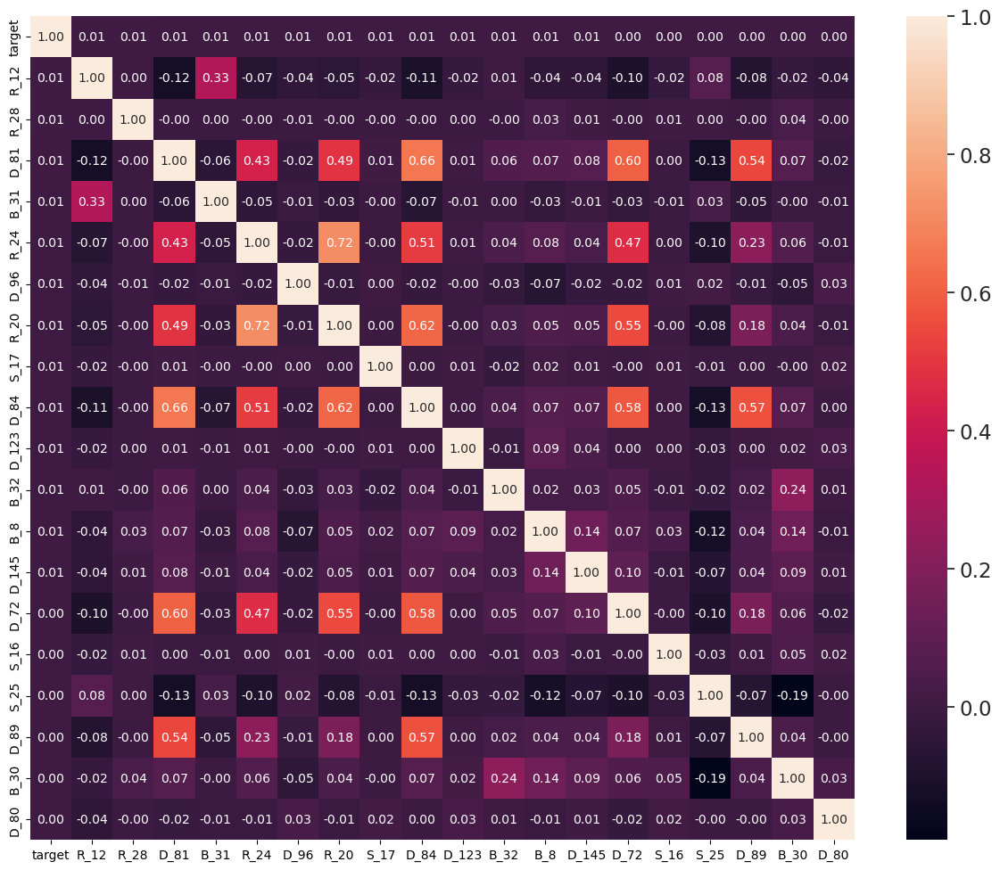

In [102]:
corrmat = df_train_filtered.corr()
f, ax = plt.subplots(figsize=(15, 12))
cols = corrmat.nlargest(20, 'target')['target'].index
cm = np.corrcoef(df_train_filtered[cols].values.T)
sns.set(font_scale=1.5)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10},
                 yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [103]:
cols = cols[1:]
cols

Index(['R_12', 'R_28', 'D_81', 'B_31', 'R_24', 'D_96', 'R_20', 'S_17', 'D_84',
       'D_123', 'B_32', 'B_8', 'D_145', 'D_72', 'S_16', 'S_25', 'D_89', 'B_30',
       'D_80'],
      dtype='object')

In the above plot we observe a kind of imbalance between the 2 classes

Text(0.5, 0.98, 'Relation between target and nine important features')

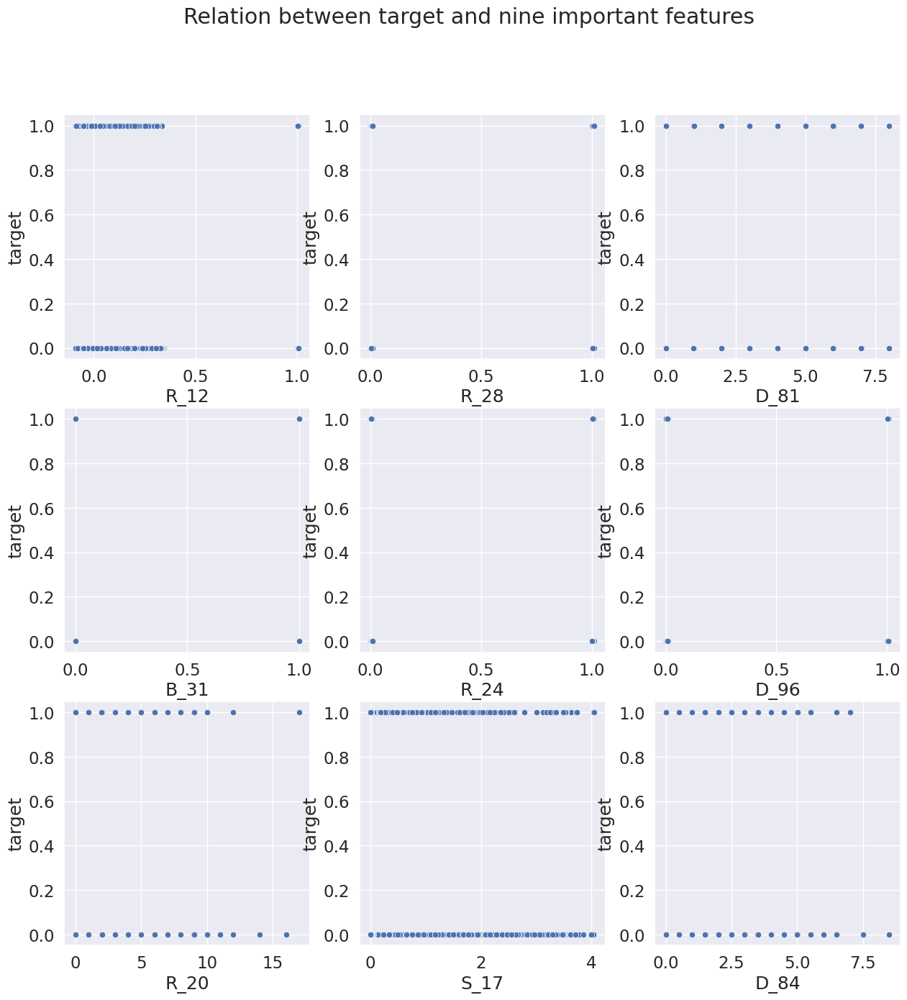

In [104]:
plt.figure(figsize=(15,15))
for i in range(len(cols[:9])):
    plt.subplot(3,3, i+1) #the figure has 3 row, 3 columns, and this plot is the i-th plot.
    sns.scatterplot(x=df_train[cols[i]], y=df_train['target'])
plt.suptitle('Relation between target and nine important features')


An outlier is an observation that significantly deviates from the other observations in a dataset. It is a data point that falls outside the expected range or pattern of the majority of the data. Outliers can occur due to various reasons, including measurement errors, data entry mistakes, natural variations in the data, or rare events.

Outliers can have a significant impact on statistical analyses, data modeling, and machine learning algorithms. They can distort summary statistics, affect the estimation of parameters, and influence the overall results and interpretations of analyses. Therefore, it is important to identify and properly handle outliers in data analysis.

In [105]:
import pandas as pd


# Extract columns starting with 'S_', 'P_', 'B_', and 'R_'
d_columns = [col for col in df_train_filtered.columns if col.startswith('D_')]
s_columns = [col for col in df_train_filtered.columns if col.startswith('S_')]
p_columns = [col for col in df_train_filtered.columns if col.startswith('P_')]
b_columns = [col for col in df_train_filtered.columns if col.startswith('B_')]
r_columns = [col for col in df_train_filtered.columns if col.startswith('R_')]

In [106]:
df_train_filtered

,P_2,D_39,B_1,B_2,R_1,D_41,B_3,B_4,D_45,B_5,R_2,D_47,B_6,B_7,B_8,D_51,B_9,R_3,D_52,B_10,S_5,B_11,S_6,D_54,R_4,B_12,S_8,D_55,B_13,R_5,D_58,B_14,D_59,D_60,B_15,S_11,D_65,B_16,B_18,B_19,B_20,D_68,S_12,R_6,S_13,B_21,D_69,B_22,D_70,D_71,D_72,S_15,B_23,P_4,D_74,D_75,B_24,R_7,B_25,B_26,D_79,R_8,S_16,D_80,R_10,R_11,B_27,D_81,S_17,R_12,B_28,R_13,D_83,R_14,R_15,D_84,R_16,B_30,S_18,D_86,R_17,R_18,B_31,S_19,R_19,B_32,S_20,R_20,R_21,B_33,D_89,R_22,R_23,D_91,D_92,D_93,D_94,R_24,R_25,D_96,S_22,S_23,S_24,S_25,S_26,D_102,D_103,D_104,D_107,B_36,B_37,R_27,B_38,D_109,D_112,B_40,D_113,D_114,D_115,D_116,D_117,D_118,D_119,D_120,D_121,D_122,D_123,D_124,D_125,D_126,D_127,D_128,D_129,B_41,D_130,D_131,D_133,R_28,D_139,D_140,D_141,D_143,D_144,D_145,target
0,0.936665,0.005775,0.004923,1.000653,0.006151,0.000798,0.002714,0.069419,0.712795,0.113239,0.006206,0.521311,0.065261,0.057744,0.001614,1.339794,0.008373,0.001984,0.202778,0.099804,0.030599,0.002749,0.002482,1.009033,0.005136,0.143530,0.919414,0.326757,0.118737,0.001610,0.148459,0.013035,0.065501,0.151387,0.017688,0.406326,0.002413,0.007148,0.647093,0.002238,0.003879,6.0,0.188970,0.004030,0.509048,0.004193,0.007842,0.001283,0.006524,0.140611,0.000094,0.101018,0.040469,0.004832,0.081413,0.074166,0.004203,0.005304,0.001864,0.000979,0.007597,0.000509,0.009810,0.000127,0.005966,0.000395,0.001327,0.007773,0.000760,1.009461,0.081843,0.000347,0.007789,0.004311,0.002332,0.009469,0.003753,0.0,0.007584,0.006677,0.001142,0.005907,1.0,0.008427,0.008979,0.001854,0.009924,0.005987,0.002247,1.006779,0.002508,0.006827,0.002837,1.503577,1.005791,0.000571,0.000391,0.008351,0.008850,0.003180,0.902135,0.136333,0.919876,0.975624,0.004561,0.786007,1.000084,1.004118,0.668647,0.003921,0.004654,1.003205,2.0,0.008707,1.007653,0.184093,0.003444,1.0,0.247217,0.0,4.0,0.243532,0.241885,0.0,0.707017,0.430501,0.001306,0.686414,0.000755,1.0,1.008394,1.004333,1.008344,0.004407,0.001034,0.004838,0.007495,0.004931,0.003954,0.003167,0.005032,0.009576,0.005492,0.009217,0.0
1,0.954180,0.091505,0.021655,1.009672,0.006815,0.007598,0.009423,0.068839,0.720884,0.060492,0.003259,0.524568,0.066982,0.056647,0.005126,1.337179,0.009355,0.007426,0.206629,0.134073,0.048367,0.010077,0.000530,1.009184,0.006961,0.137014,1.001977,0.304124,0.114534,0.006328,0.139504,0.056653,0.070607,0.305883,0.063955,0.406768,0.001878,0.003636,0.645819,0.000408,0.004578,6.0,0.495308,0.006838,0.679257,0.001337,0.006025,0.009393,0.002615,0.075868,0.007152,0.103239,0.047454,0.006561,0.078891,0.076510,0.001782,0.001422,0.005419,0.006149,0.003094,0.008295,0.009362,0.000954,0.005447,0.007345,0.007624,0.008811,0.004056,1.004291,0.081954,0.002709,0.004093,0.007139,0.008358,0.002325,0.007381,0.0,0.005901,0.001185,0.008013,0.008882,1.0,0.007327,0.002016,0.008686,0.008446,0.007291,0.007794,1.001014,0.009634,0.009820,0.005080,1.503359,1.005801,0.007425,0.009234,0.002471,0.009769,0.005433,0.939654,0.134938,0.958699,0.974067,0.011736,0.806840,1.003014,1.009285,0.670901,0.001264,0.019176,1.000754,2.0,0.004092,1.004312,0.154837,0.003269,1.0,0.239867,0.0,4.0,0.240768,0.239710,0.0,0.704843,0.434409,0.003954,0.690101,0.009617,1.0,1.009307,1.007831,1.006878,0.003221,0.005681,0.005497,0.009227,0.009123,0.003269,0.007329,0.000427,0.003429,0.006986,0.002603,0.0
2,0.960384,0.002455,0.013683,1.002700,0.001373,0.000685,0.005531,0.055630,0.723997,0.166782,0.009918,0.530929,0.083720,0.049253,0.001418,1.339909,0.006782,0.003515,0.208214,0.134437,0.030063,0.009667,0.000783,1.007456,0.008706,0.129017,0.704016,0.275055,0.120740,0.004980,0.138100,0.012498,0.065926,0.273553,0.022732,0.405175,0.005899,0.005896,0.654358,0.005897,0.005207,6.0,0.508670,0.008183,0.515282,0.008716,0.005271,0.004554,0.002052,0.150209,0.005364,0.206394,0.031705,0.009559,0.077490,0.071547,0.005595,0.006363,0.000646,0.009193,0.003895,0.005153,0.004876,0.005665,0.001888,0.004961,0.000034,0.004652,0.006969,1.004728,0.060634,0.009982,0.008817,0.008690,0.007364,0.005924,0.008802,0.0,0.002520,0.003324,0.009455,0.008348,1.0,0.007053,0.003

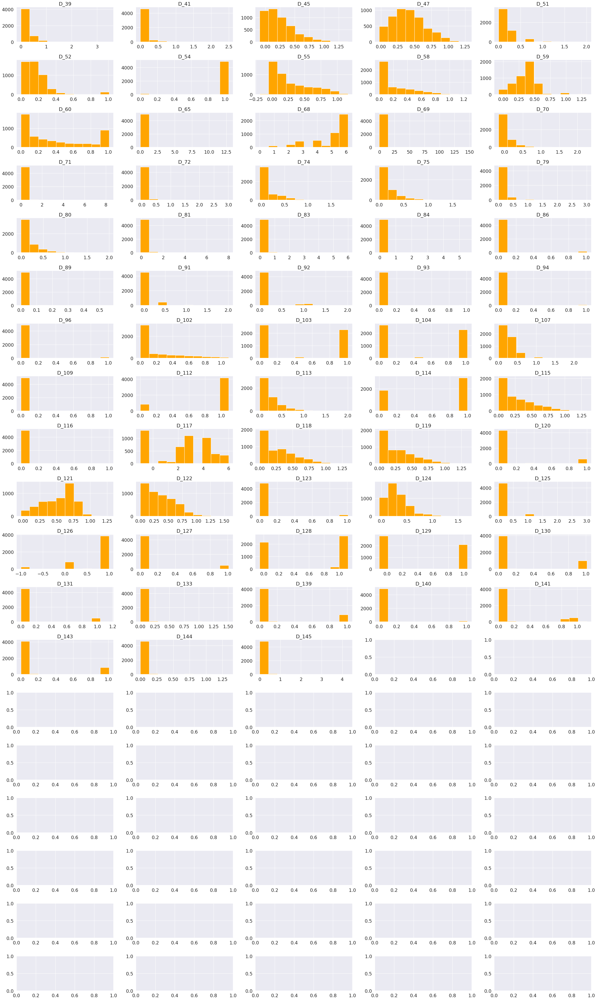

In [107]:
#plot distribution for D variables
nrows=19
ncols=5
fig, axes = plt.subplots(nrows, ncols, figsize=(30,50)) 
axes = axes.flatten()  
train_df_sample = df_train_filtered.sample(frac =.1)
for ax,col in zip(axes,d_columns):
    ax.hist(train_df_sample[col],color="orange")
    ax.set_title(col)
    
plt.tight_layout()

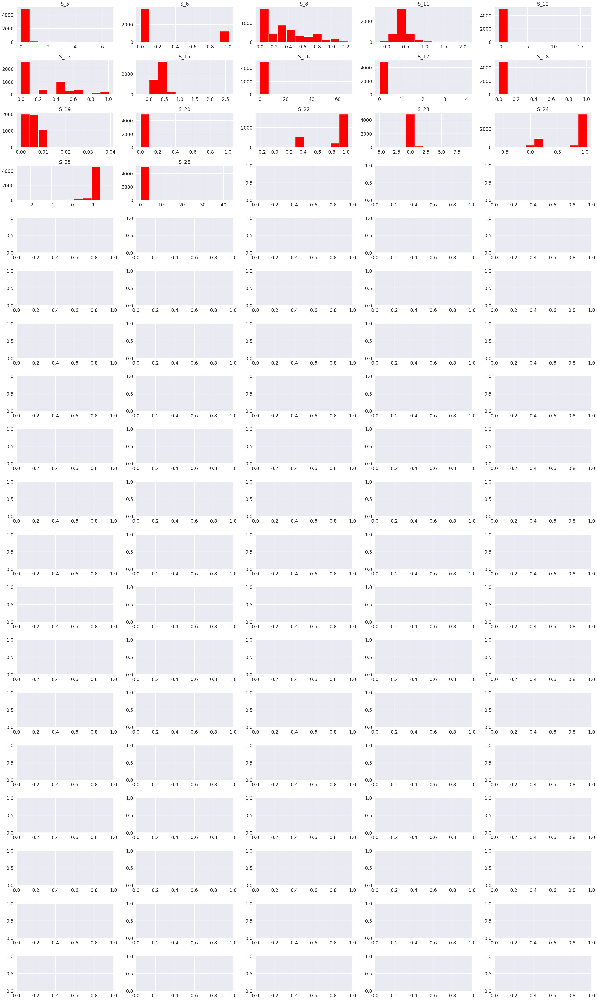

In [108]:
#plot distribution for S variables
nrows=19
ncols=5
fig, axes = plt.subplots(nrows, ncols, figsize=(30,50)) 
axes = axes.flatten()  
train_df_sample = df_train_filtered.sample(frac =.1)
for ax,col in zip(axes,s_columns):
    ax.hist(train_df_sample[col],color="red")
    ax.set_title(col)
    
plt.tight_layout()

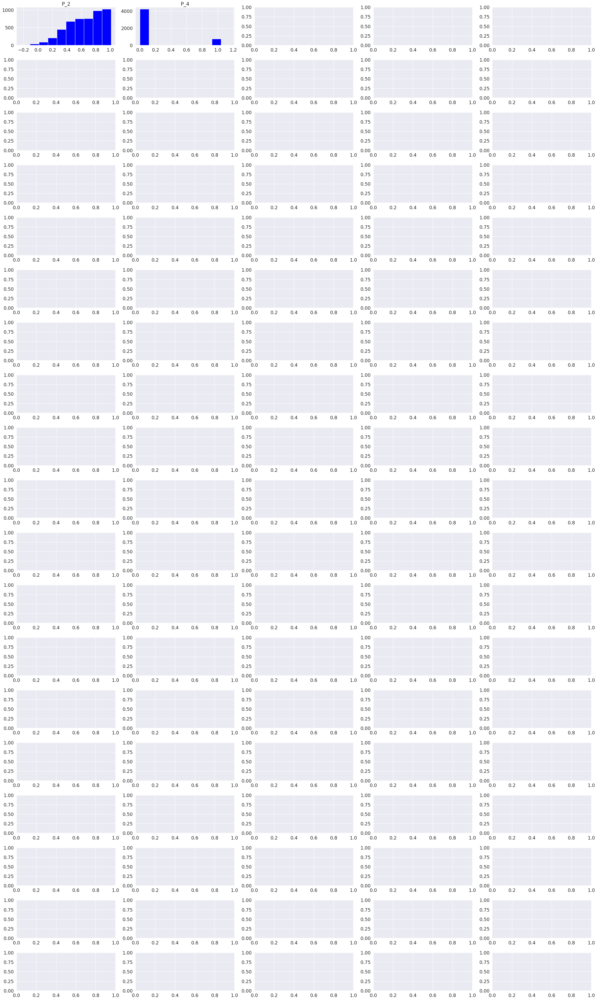

In [109]:
#plot distribution for P variables
nrows=19
ncols=5
fig, axes = plt.subplots(nrows, ncols, figsize=(30,50)) 
axes = axes.flatten()  
train_df_sample = df_train_filtered.sample(frac =.1)
for ax,col in zip(axes,p_columns):
    ax.hist(train_df_sample[col],color="blue")
    ax.set_title(col)
    
plt.tight_layout()

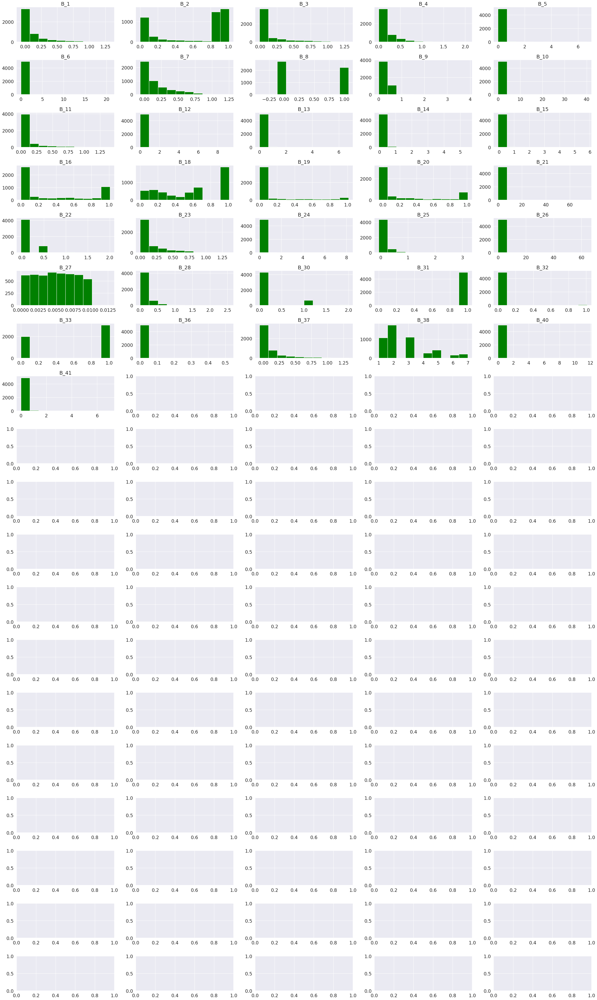

In [110]:
#plot distribution for B variables
nrows=19
ncols=5
fig, axes = plt.subplots(nrows, ncols, figsize=(30,50)) 
axes = axes.flatten()  
train_df_sample = df_train_filtered.sample(frac =.1)
for ax,col in zip(axes,b_columns):
    ax.hist(train_df_sample[col],color="green")
    ax.set_title(col)
    
plt.tight_layout()

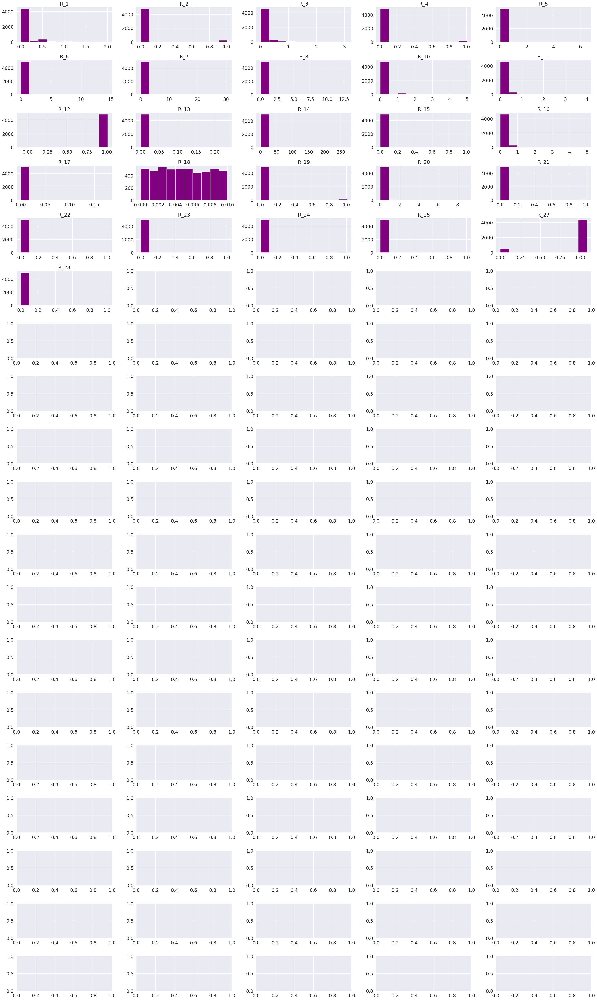

In [111]:
#plot distribution for R variables
nrows=19
ncols=5
fig, axes = plt.subplots(nrows, ncols, figsize=(30,50)) 
axes = axes.flatten()  
train_df_sample = df_train_filtered.sample(frac =.1)
for ax,col in zip(axes,r_columns):
    ax.hist(train_df_sample[col],color="purple")
    ax.set_title(col)
    
plt.tight_layout()

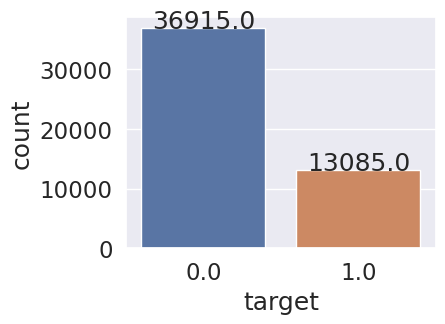

In [112]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(4, 3))
ax = sns.countplot(x='target', data=df_train_filtered)

# Add count labels to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()

# **Data Preparation**

First we need to address the data imbalance

SMOTE (Synthetic Minority Oversampling Technique) is a popular algorithm for addressing class imbalance in machine learning datasets. It is an oversampling technique that aims to balance the class distribution by generating synthetic samples for the minority class. Here's some information you can include in your report about SMOTE:

* Introduction to SMOTE:

    SMOTE is designed to alleviate the problem of class imbalance, where one class (the minority class) has significantly fewer samples than the other class(es) (the majority class).It was introduced by Nitesh V. Chawla, et al., in their paper "SMOTE: Synthetic Minority Over-sampling Technique" in 2002.

* How SMOTE Works:

    SMOTE works by creating synthetic samples in the feature space of the minority class.The basic idea is to identify the feature space neighborhood of a minority class sample and create synthetic examples by interpolating between existing minority class samples. For each minority class sample, SMOTE selects a few nearest neighbors (based on a distance metric like Euclidean distance) and generates synthetic samples along the line segments connecting the sample to its neighbors. The synthetic samples are generated by randomly selecting a specific number of nearest neighbors and computing a weighted average of the feature values to create new synthetic examples.
    
* Implementing SMOTE:

    SMOTE is widely available in machine learning libraries, such as the imbalanced-learn library in Python, where you can easily apply it to your dataset. You can use the SMOTE class from the imblearn.over_sampling module to perform SMOTE oversampling on your data.



In [113]:
from imblearn.over_sampling import SMOTE

# Separate the features (X) and the target variable (y)
X_train = df_train_filtered.drop('target', axis=1)
y_train = df_train_filtered['target']

# Apply SMOTE to the training data
smote = SMOTE(k_neighbors=5, random_state=42)
X_best_train, y_best_train = smote.fit_resample(X_train, y_train)

df_train_filtered = pd.concat([pd.DataFrame(X_best_train, columns=X_train.columns), pd.Series(y_best_train, name='target')], axis=1)


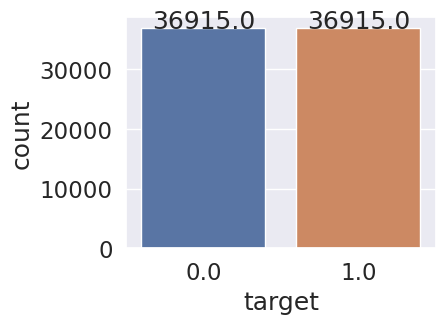

In [114]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(4, 3))
ax = sns.countplot(x='target', data=df_train_filtered)

# Add count labels to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()

In [115]:
df_train_filtered[d_columns].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73830 entries, 0 to 73829
Data columns (total 63 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   D_39    73830 non-null  float64
 1   D_41    73830 non-null  float64
 2   D_45    73830 non-null  float64
 3   D_47    73830 non-null  float64
 4   D_51    73830 non-null  float64
 5   D_52    73830 non-null  float64
 6   D_54    73830 non-null  float64
 7   D_55    73830 non-null  float64
 8   D_58    73830 non-null  float64
 9   D_59    73830 non-null  float64
 10  D_60    73830 non-null  float64
 11  D_65    73830 non-null  float64
 12  D_68    73830 non-null  float64
 13  D_69    73830 non-null  float64
 14  D_70    73830 non-null  float64
 15  D_71    73830 non-null  float64
 16  D_72    73830 non-null  float64
 17  D_74    73830 non-null  float64
 18  D_75    73830 non-null  float64
 19  D_79    73830 non-null  float64
 20  D_80    73830 non-null  float64
 21  D_81    73830 non-null  float64
 22

Scatter plots for each column

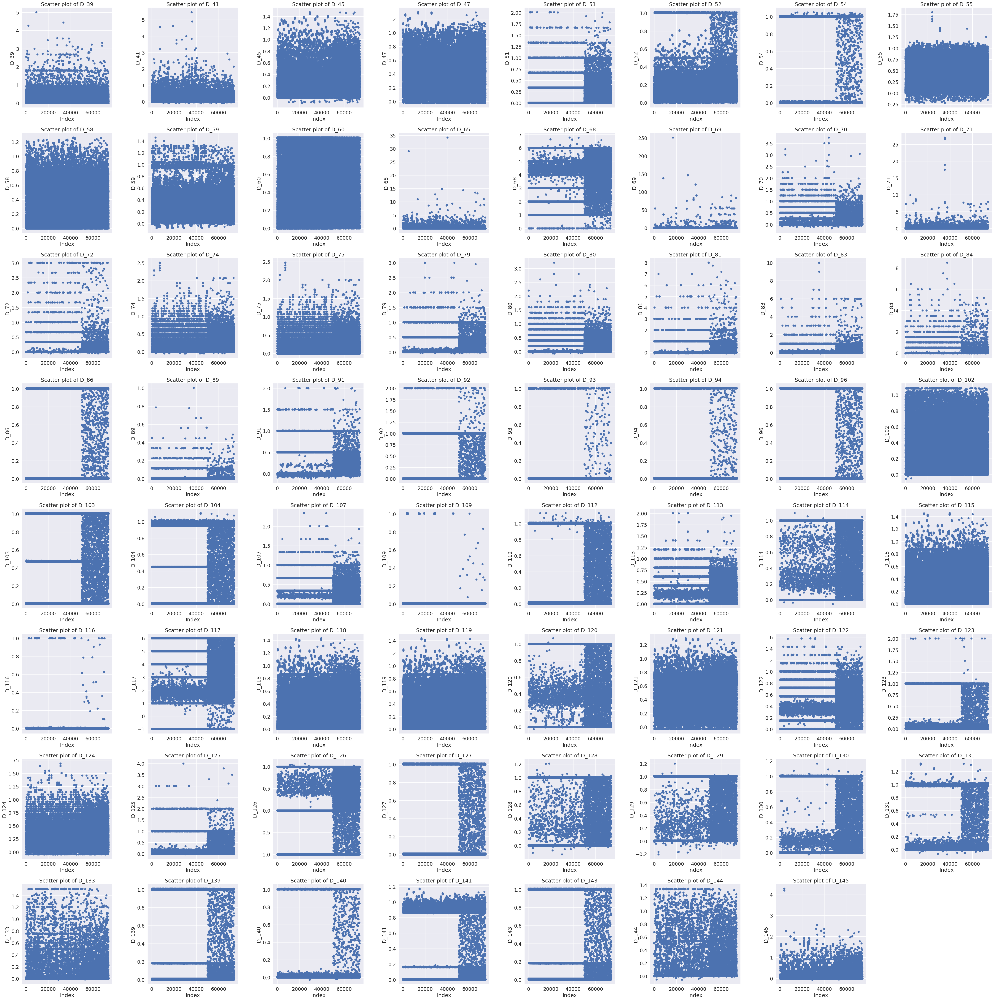

In [116]:
import matplotlib.pyplot as plt
import math

def plot_scatter_plots(dataframe, columns):
    num_plots = len(columns)
    ncols = int(math.ceil(math.sqrt(num_plots)))  # Calculate the number of columns based on the square root of the number of plots
    nrows = int(math.ceil(num_plots / ncols))  # Calculate the number of rows based on the number of columns
    figsize = (ncols * 6, nrows * 6)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    fig.subplots_adjust(hspace=0.5, wspace=0.5)

    for i, colname in enumerate(columns):
        row = i // ncols
        col = i % ncols
        ax = axes[row][col]
        ax.scatter(dataframe.index, dataframe[colname])
        ax.set_xlabel('Index')
        ax.set_ylabel(colname)
        ax.set_title(f'Scatter plot of {colname}')

    # Remove any unused subplots
    if num_plots < nrows * ncols:
        for i in range(num_plots, nrows * ncols):
            row = i // ncols
            col = i % ncols
            fig.delaxes(axes[row][col])

    plt.tight_layout()
    plt.show()

# Usage example
plot_scatter_plots(df_train_filtered, d_columns)


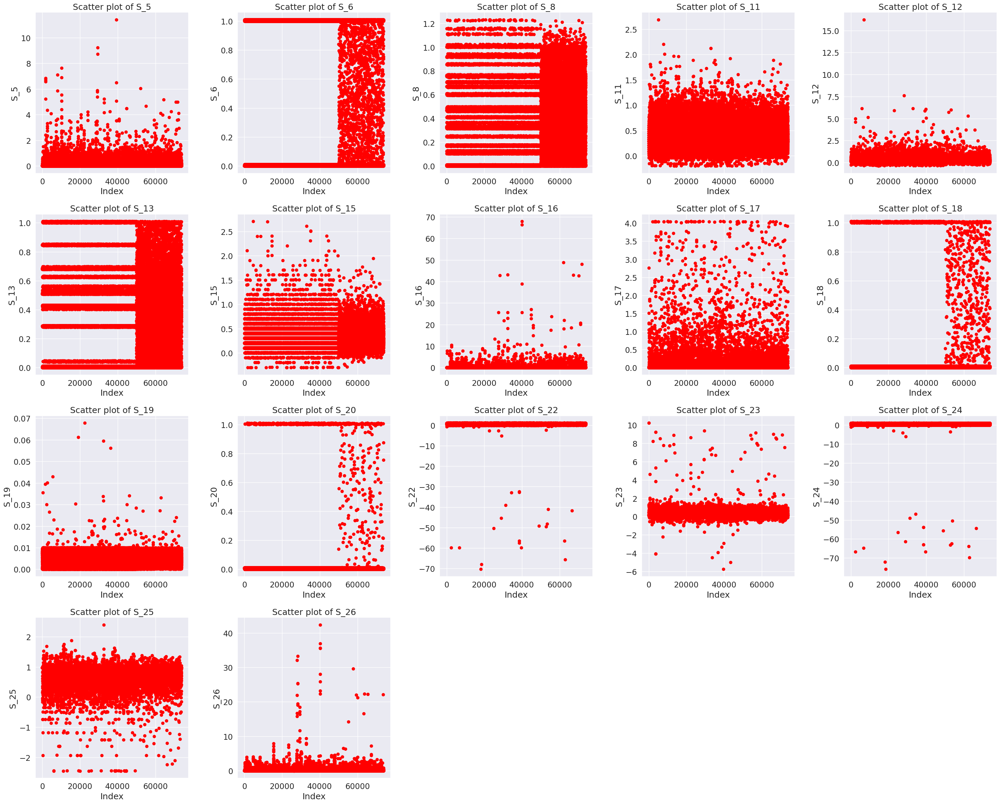

In [117]:
import matplotlib.pyplot as plt
import math

def plot_scatter_plots(dataframe, columns):
    num_plots = len(columns)
    ncols = int(math.ceil(math.sqrt(num_plots)))  # Calculate the number of columns based on the square root of the number of plots
    nrows = int(math.ceil(num_plots / ncols))  # Calculate the number of rows based on the number of columns
    figsize = (ncols * 6, nrows * 6)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    fig.subplots_adjust(hspace=0.5, wspace=0.5)

    for i, colname in enumerate(columns):
        row = i // ncols
        col = i % ncols
        ax = axes[row][col]
        ax.scatter(dataframe.index, dataframe[colname],color="red")
        ax.set_xlabel('Index')
        ax.set_ylabel(colname)
        ax.set_title(f'Scatter plot of {colname}')

    # Remove any unused subplots
    if num_plots < nrows * ncols:
        for i in range(num_plots, nrows * ncols):
            row = i // ncols
            col = i % ncols
            fig.delaxes(axes[row][col])

    plt.tight_layout()
    plt.show()

# Usage example
plot_scatter_plots(df_train_filtered, s_columns)


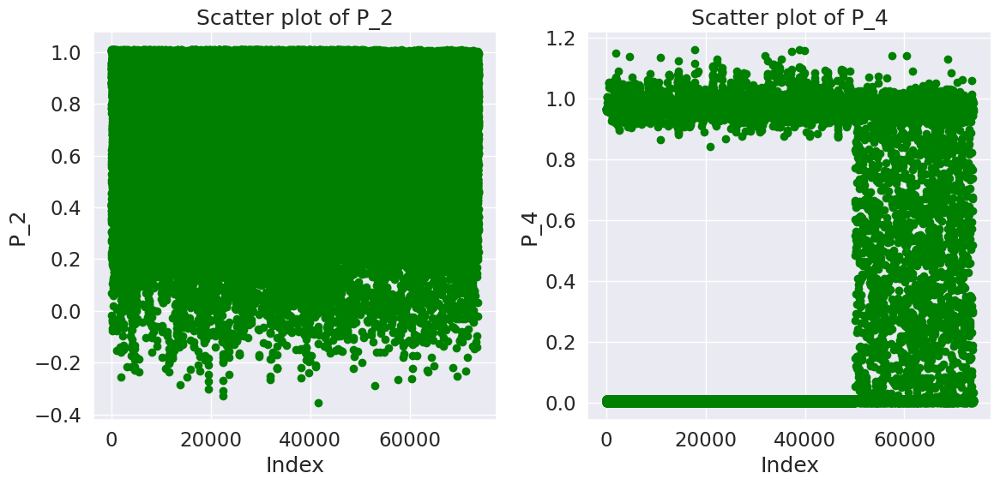

In [118]:
import matplotlib.pyplot as plt
import math

def plot_scatter_plots(dataframe, columns):
    num_plots = len(columns)
    ncols = int(math.ceil(math.sqrt(num_plots)))  # Calculate the number of columns based on the square root of the number of plots
    nrows = int(math.ceil(num_plots / ncols))  # Calculate the number of rows based on the number of columns
    figsize = (ncols * 6, nrows * 6)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    fig.subplots_adjust(hspace=0.5, wspace=0.5)

    axes = axes.flatten()  # Flatten the axes array

    for i, colname in enumerate(columns):
        ax = axes[i]  # Access each subplot using a single index
        ax.scatter(dataframe.index, dataframe[colname], color="green")
        ax.set_xlabel('Index')
        ax.set_ylabel(colname)
        ax.set_title(f'Scatter plot of {colname}')

    # Remove any unused subplots
    if num_plots < nrows * ncols:
        for i in range(num_plots, nrows * ncols):
            fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

# Usage example
plot_scatter_plots(df_train_filtered, p_columns)


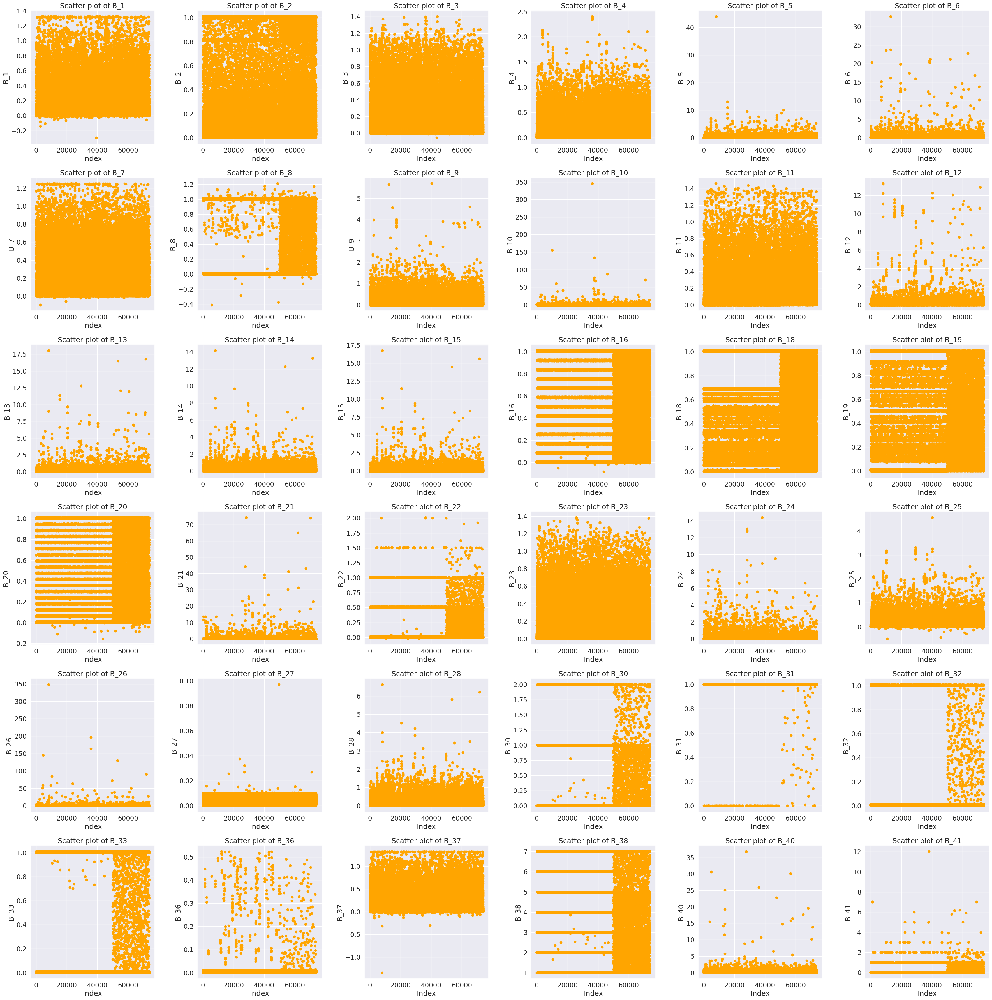

In [119]:
import matplotlib.pyplot as plt
import math

def plot_scatter_plots(dataframe, columns):
    num_plots = len(columns)
    ncols = int(math.ceil(math.sqrt(num_plots)))  # Calculate the number of columns based on the square root of the number of plots
    nrows = int(math.ceil(num_plots / ncols))  # Calculate the number of rows based on the number of columns
    figsize = (ncols * 6, nrows * 6)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    fig.subplots_adjust(hspace=0.5, wspace=0.5)

    for i, colname in enumerate(columns):
        row = i // ncols
        col = i % ncols
        ax = axes[row][col]
        ax.scatter(dataframe.index, dataframe[colname],color="orange")
        ax.set_xlabel('Index')
        ax.set_ylabel(colname)
        ax.set_title(f'Scatter plot of {colname}')

    # Remove any unused subplots
    if num_plots < nrows * ncols:
        for i in range(num_plots, nrows * ncols):
            row = i // ncols
            col = i % ncols
            fig.delaxes(axes[row][col])

    plt.tight_layout()
    plt.show()

# Usage example
plot_scatter_plots(df_train_filtered, b_columns)


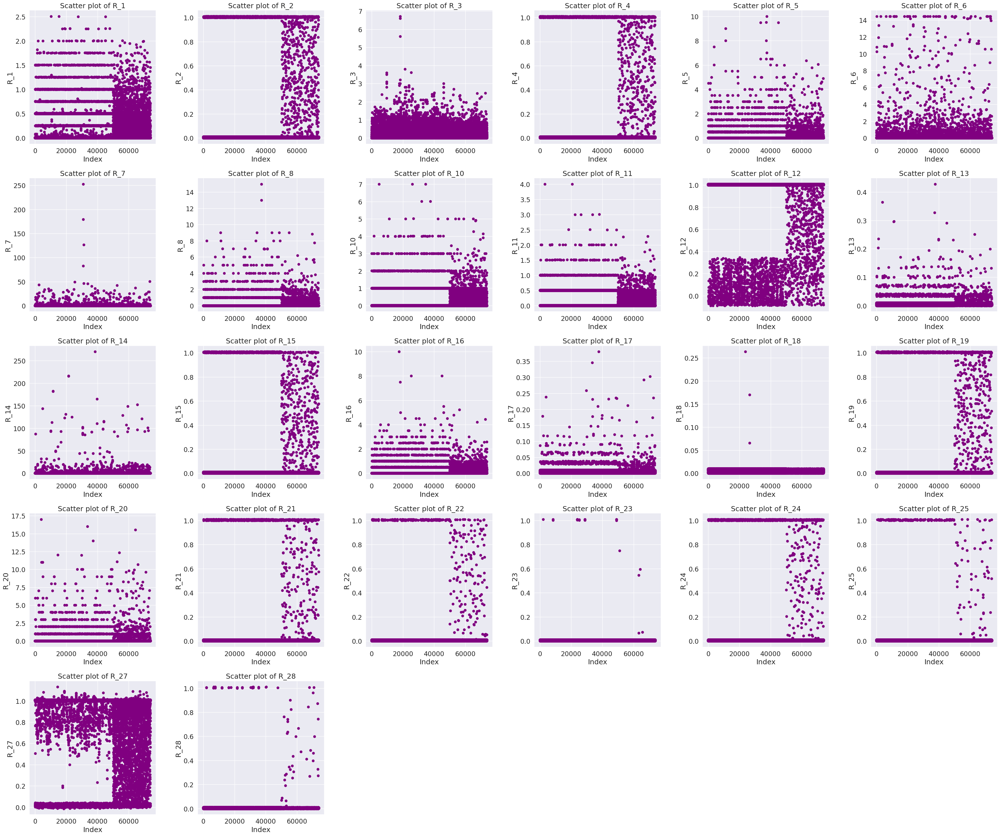

In [120]:
import matplotlib.pyplot as plt
import math

def plot_scatter_plots(dataframe, columns):
    num_plots = len(columns)
    ncols = int(math.ceil(math.sqrt(num_plots)))  # Calculate the number of columns based on the square root of the number of plots
    nrows = int(math.ceil(num_plots / ncols))  # Calculate the number of rows based on the number of columns
    figsize = (ncols * 6, nrows * 6)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    fig.subplots_adjust(hspace=0.5, wspace=0.5)

    for i, colname in enumerate(columns):
        row = i // ncols
        col = i % ncols
        ax = axes[row][col]
        ax.scatter(dataframe.index, dataframe[colname],color="purple")
        ax.set_xlabel('Index')
        ax.set_ylabel(colname)
        ax.set_title(f'Scatter plot of {colname}')

    # Remove any unused subplots
    if num_plots < nrows * ncols:
        for i in range(num_plots, nrows * ncols):
            row = i // ncols
            col = i % ncols
            fig.delaxes(axes[row][col])

    plt.tight_layout()
    plt.show()

# Usage example
plot_scatter_plots(df_train_filtered, r_columns)


# **Model Construction**

# How to Import the DecisionTreeClassifer Class
from sklearn.tree import DecisionTreeClassifier
DecisionTreeClassifier(
    *,
    criterion='gini',
    splitter='best',
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    class_weight=None,
    ccp_alpha=0.0
)

Parameter	Default Value	Description

* criterion=	'gini'	The function to measure the quality of  a split. Either 'gini' or 'entropy'.
* splitter=	'best'	The strategy to choose the best split. Either 'best' or 'random'
* max_depth=	None	The maximum depth of the tree. If None, the nodes are expanded until all leaves are pure or until they contain less than the min_samples_split
* min_samples_split=	2	The minimum number of samples required to split a node.
* min_samples_leaf=	1	The minimum number of samples require to be at a leaf node.
* min_weight_fraction_leaf=	0.0	The minimum weighted fraction of the sum of weights of all the input samples required to be at a node.
* max_features=	None	The number of features to consider when looking for the best split. Can be:
– int,
– float,
– 'auto' (the square root of number of features),
– 'sqrt' (same as auto),
– 'log2' (log of number of features),
– None (the number of features)
* random_state=	None	The control for the randomness of the estimator
* max_leaf_nodes=	None	Grow a tree with a maximum number of nodes. If None, then an unlimited number is possible.
* min_impurity_decrease=	0.0	A node will be split if this split decreases the impurity greater than or equal to this value.
* class_weight=	None	Weights associated with different classes.
* ccp_alpha=	0.0	Complexity parameter used for Minimal Cost-Complexity Pruning.


In [121]:
X_best_train, X_best_test, y_best_train, y_best_test = train_test_split(X_best_train, y_best_train, test_size=0.2, random_state=42)
X_best_train, X_best_val, y_best_train, y_best_val = train_test_split(X_best_train, y_best_train, test_size=0.2, random_state=42)

In [122]:
#Use sklearn for decsion tree

#Importing the CLassifier
from sklearn.tree import DecisionTreeClassifier
dt_default = DecisionTreeClassifier(criterion="entropy")
#.fit method to train the model
dt_default.fit(X_best_train,y_best_train)

DecisionTreeClassifier(criterion='entropy')

In [123]:
#  check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

# making predictions
y_predict_default = dt_default.predict(X_best_test)

# Printing classifier report after prediction
print(classification_report(y_best_test,y_predict_default))

              precision    recall  f1-score   support

         0.0       0.68      0.64      0.66      7321
         1.0       0.67      0.71      0.69      7445

    accuracy                           0.68     14766
   macro avg       0.68      0.68      0.68     14766
weighted avg       0.68      0.68      0.68     14766



### Visualize the decision tree

# **Decision Tree Pruning**

The main idea is to iteratively prune the decision tree by removing branches or nodes that do not
significantly improve the model's predictive power. This pruning process is guided by a complexity parameter called alpha, often referred to as ccp_alpha in scikit-learn's DecisionTreeClassifier.

Cost complexity pruning, also known as minimal cost complexity pruning or weakest link pruning, is a technique used to prune decision trees based on a cost-complexity measure. The goal of pruning is to create a simpler and more generalized decision tree by removing unnecessary branches and nodes. Cost complexity pruning helps to prevent overfitting and improve the model's ability to generalize to unseen data.

During pruning, the algorithm calculates the impurity reduction that would be achieved by removing a node and its subtree. It compares this reduction with the corresponding alpha value to determine whether the removal is justified. Nodes with smaller impurity reductions relative to their alpha values are pruned, leading to a simpler and more regularized tree.

Cost complexity pruning helps to avoid overfitting by controlling the complexity of the decision tree and preventing it from memorizing the training data. It strikes a balance between model complexity and performance by finding an optimal trade-off point.

The process of cost complexity pruning typically involves the following steps:

* Start with an initial decision tree: 

    We begin with a fully grown decision tree that has not been pruned.

* Calculate the cost complexity of each subtree: 

    For each internal node in the decision tree, we calculate the cost complexity measure. The cost complexity measure is defined as the sum of two components: the total impurity of the subtree and the complexity cost. The complexity cost is given by α times the number of leaf nodes in the subtree.

* Determine the effective alpha values: 

    The effective alpha values represent the minimum alpha values required to remove subtrees at each internal node without increasing the total cost complexity of the tree. We can obtain a list of effective alpha values by iteratively considering each internal node and selecting the minimum alpha value that allows pruning while maintaining the overall cost complexity.

* Prune the decision tree: 

    Using the effective alpha values, we prune the decision tree by removing the subtrees associated with alpha values greater than the effective alpha. This process involves removing the unnecessary branches and nodes that contribute less to the overall predictive power of the tree.

* Select the optimal pruned tree: 

    After pruning, we evaluate the pruned decision trees on a validation set or using cross-validation. We select the decision tree with the highest performance, such as accuracy or F1-score, on the validation set as the optimal pruned tree.
    
The code performs cost complexity pruning on a decision tree classifier to find an optimal decision tree model. It prunes the decision tree using different values of the alpha parameter, which controls the amount of regularization applied during pruning. The code then evaluates the pruned decision trees on training, testing, and validation datasets based on their accuracy scores. It plots the number of nodes versus accuracy to visualize the trade-off between model complexity and performance. Finally, it selects the optimal decision tree based on the highest validation accuracy and evaluates it on the testing dataset using the classification report.


In [124]:
# Split the data into train and remaining (test_val) sets
pr_X_train, X_ignore, pr_y_train, y_ignore = train_test_split(X_best_train, y_best_train, test_size=0.7, random_state=42)

# Split the remaining (test_val) set into test and validation sets
pr_X_test, pr_X_val, pr_y_test, pr_y_val = train_test_split(pr_X_train, pr_y_train, test_size=0.5, random_state=42)

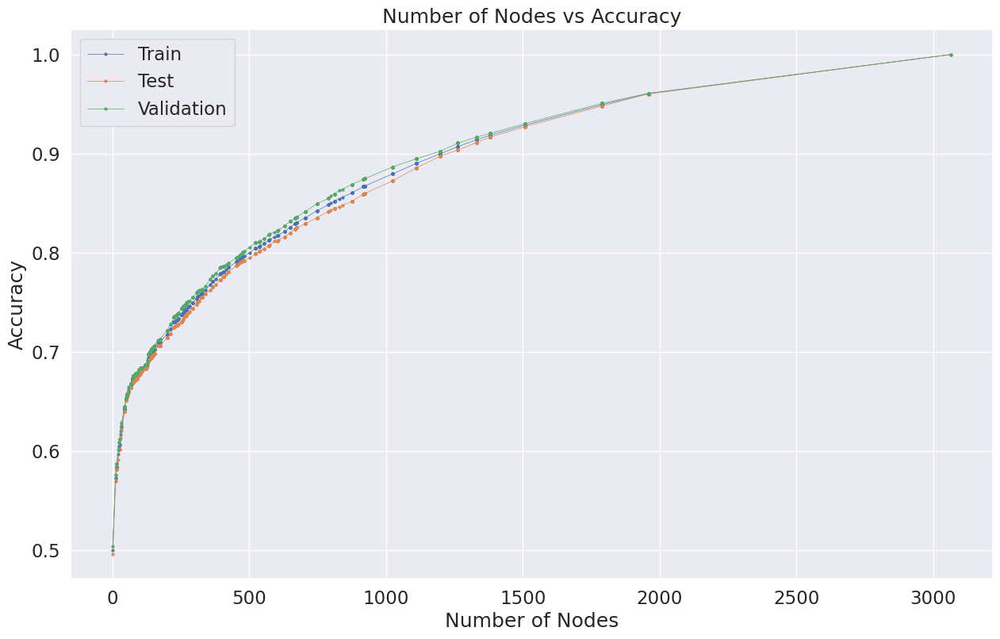

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      3518
         1.0       1.00      1.00      1.00      3569

    accuracy                           1.00      7087
   macro avg       1.00      1.00      1.00      7087
weighted avg       1.00      1.00      1.00      7087



In [127]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
import matplotlib.pyplot as plt
# Prune the decision tree using reduuced error pruning
#It applies cost complexity pruning to the decision tree classifier (clf) using the cost_complexity_pruning_path method.
#This method returns the effective alphas for pruning ccp_alphas) and the corresponding impurities at each step (impurities).
path = dt_default.cost_complexity_pruning_path(pr_X_train, pr_y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

#It creates an empty list (clfs) to store the pruned decision trees.
#It iterates over eachh alpha value in ccp_alphas and creates a new decision tree classifier (clf) with the specified alpha.
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(pr_X_train, pr_y_train)
    clfs.append(clf)
#It fits the decision tree on the training data.
#It appends the fitted decision tree to the list of pruned decision trees.

#It calculates the number of nodes (train_nodes) and accuracy scores (train_scores, test_scores, val_scores) for each pruned decision tree on the training, testing, and validation datasets, respectively.
#It plots the number of nodes versus accuracy using a line plot. The plot includes separate lines for the training, testing, and validation accuracies.
train_nodes = [clf.tree_.node_count for clf in clfs]
train_scores = [clf.score(pr_X_train, pr_y_train) for clf in clfs]
test_scores = [clf.score(pr_X_test, pr_y_test) for clf in clfs]
val_scores = [clf.score(pr_X_val, pr_y_val) for clf in clfs]



# Plotting the number of nodes vs accuracy
plt.figure(figsize=(15, 9))
plt.plot(train_nodes, train_scores, marker='o', label="Train", linewidth=0.5, markersize=2)
plt.plot(train_nodes, test_scores, marker='o', label="Test", linewidth=0.5, markersize=2)
plt.plot(train_nodes, val_scores, marker='o', label="Validation", linewidth=0.5, markersize=2)
plt.xlabel("Number of Nodes")
plt.ylabel("Accuracy")
plt.title("Number of Nodes vs Accuracy")
plt.legend()
plt.show()

#It finds the optimal decision tree based on the highest validation accuracy by selecting the decision tree with the highest validation score (val_scores) and its corresponding alpha (optimal_alpha).
# Find the optimal decision tree based on validation accuracy
optimal_alpha = ccp_alphas[np.argmax(val_scores)]
optimal_clf = clfs[np.argmax(val_scores)]

# Make predictions on the new testing data using the optimal decision tree
y_new_pred = optimal_clf.predict(pr_X_test)

# Evaluate the model
print(classification_report(pr_y_test,y_new_pred))

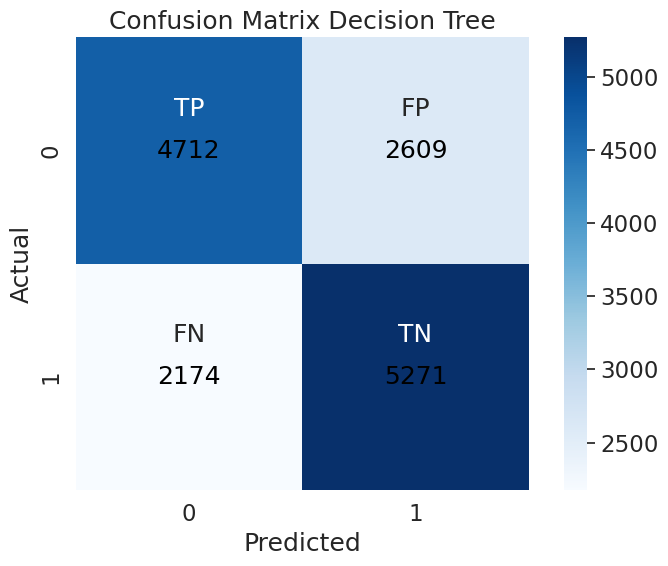

In [143]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import ScalarMappable

# Create a confusion matrix
cm = confusion_matrix(y_best_test, y_predict_default)

# Define class labels
class_names = ['0', '1']
labels = ['TP\n\n\n','FP\n\n\n','FN\n\n\n','TN\n\n\n']
labels = np.asarray(labels).reshape(2,2)

# Create a heatmap with seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues',  square=True,
            xticklabels=class_names, yticklabels=class_names)

# Add labels, title, and axis ticks
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix Decision Tree")
plt.xticks(ticks=[0.5, 1.5], labels=class_names)
plt.yticks(ticks=[0.5, 1.5], labels=class_names)

# Display data points in each square
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j + 0.5, i + 0.5, cm[i, j], ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

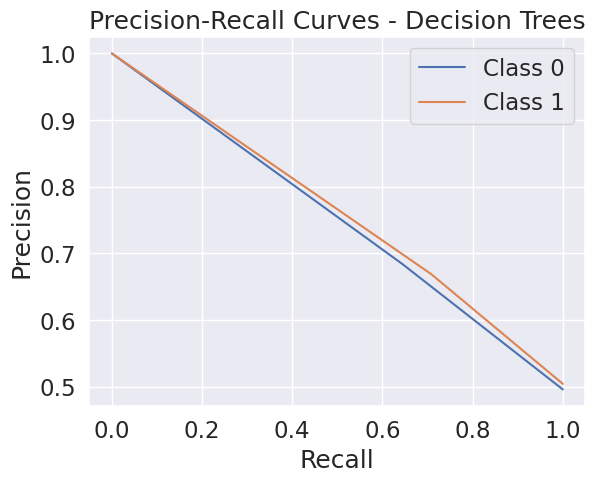

In [144]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# Get the probabilities for each class
probas =dt_default.predict_proba(X_best_test)

# Compute precision and recall for class 0 (<= 50K)
precision_0, recall_0, _ = precision_recall_curve(y_best_test, probas[:, 0], pos_label=0)

# Compute precision and recall for class 1 (>= 50K)
precision_1, recall_1, _ = precision_recall_curve(y_best_test, probas[:, 1], pos_label=1)

# Plot precision-recall curves
plt.plot(recall_0, precision_0, label='Class 0')
plt.plot(recall_1, precision_1, label='Class 1')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves - Decision Trees')
plt.legend()
plt.grid(True)
plt.show()

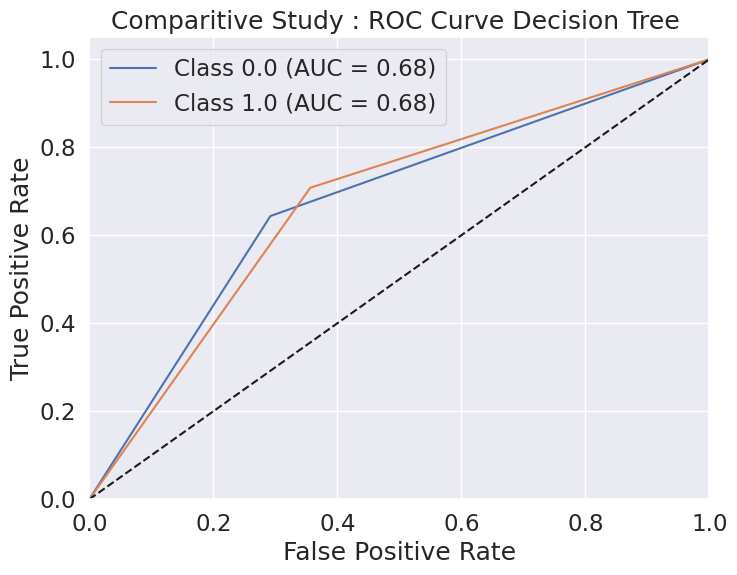

In [145]:
from sklearn.metrics import roc_curve, auc

# Get the predicted probabilities for each class
probas = dt_default.predict_proba(X_best_test)

# Compute the ROC curve for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(dt_default.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_best_test, probas[:, i], pos_label=dt_default.classes_[i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(dt_default.classes_)):
    plt.plot(fpr[i], tpr[i], label=f'Class {dt_default.classes_[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Plot the diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Comparitive Study : ROC Curve Decision Tree ')
plt.legend()
plt.grid(True)
plt.show()

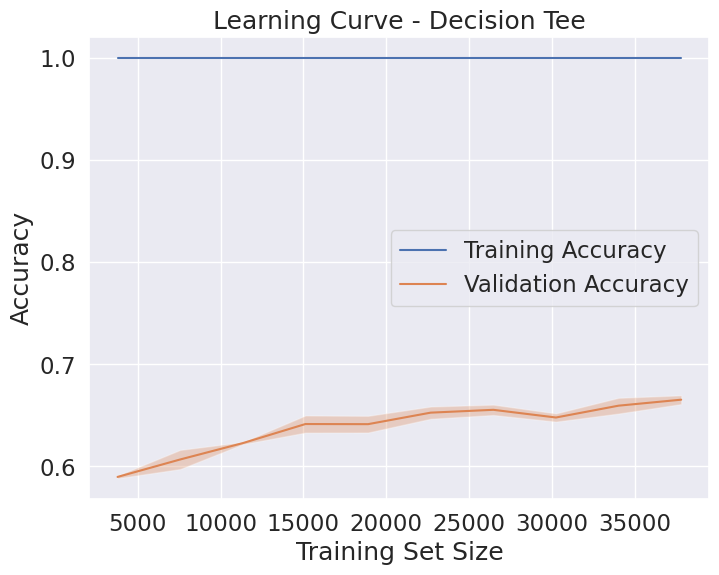

In [146]:
from sklearn.model_selection import learning_curve

# Define the training sizes for the learning curve
train_sizes, train_scores, test_scores = learning_curve(
    dt_default, X_best_train, y_best_train, cv=5, scoring='accuracy', train_sizes=np.linspace(0.1, 1.0, 10))

# Calculate the mean and standard deviation of the training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_scores_mean, label='Training Accuracy')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.3)
plt.plot(train_sizes, test_scores_mean, label='Validation Accuracy')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.3)
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve - Decision Tee')
plt.legend()
plt.grid(True)
plt.show()

# **Random Forest Classifier**

In [136]:
#Importing the required libraries
from sklearn.ensemble import RandomForestClassifier

#Building the Classifier
random_forest = RandomForestClassifier(random_state = 50)
#Training
random_forest.fit(X_best_train, y_best_train)

#Predictions
y_randomforest_predictions = random_forest.predict(X_best_test)

In [137]:
from sklearn.metrics import f1_score
#Evaluation Metrics of the model Accuracy and fscore

# Evaluate performance
print(classification_report(y_best_test, y_randomforest_predictions))

              precision    recall  f1-score   support

         0.0       0.76      0.96      0.85      7321
         1.0       0.95      0.71      0.81      7445

    accuracy                           0.84     14766
   macro avg       0.86      0.84      0.83     14766
weighted avg       0.86      0.84      0.83     14766



Performance metrics for Random Forest

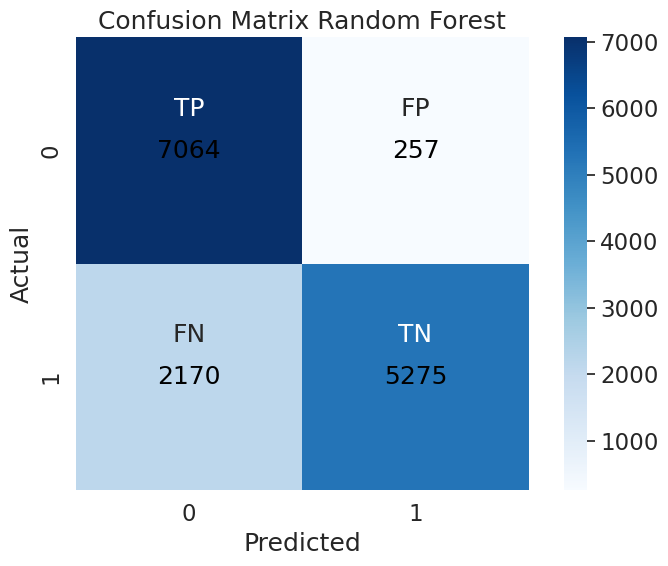

In [138]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import ScalarMappable

# Create a confusion matrix
cm = confusion_matrix(y_best_test, y_randomforest_predictions)

# Define class labels
class_names = ['0', '1']
labels = ['TP\n\n\n','FP\n\n\n','FN\n\n\n','TN\n\n\n']
labels = np.asarray(labels).reshape(2,2)

# Create a heatmap with seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues',  square=True,
            xticklabels=class_names, yticklabels=class_names)

# Add labels, title, and axis ticks
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix Random Forest")
plt.xticks(ticks=[0.5, 1.5], labels=class_names)
plt.yticks(ticks=[0.5, 1.5], labels=class_names)

# Display data points in each square
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j + 0.5, i + 0.5, cm[i, j], ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

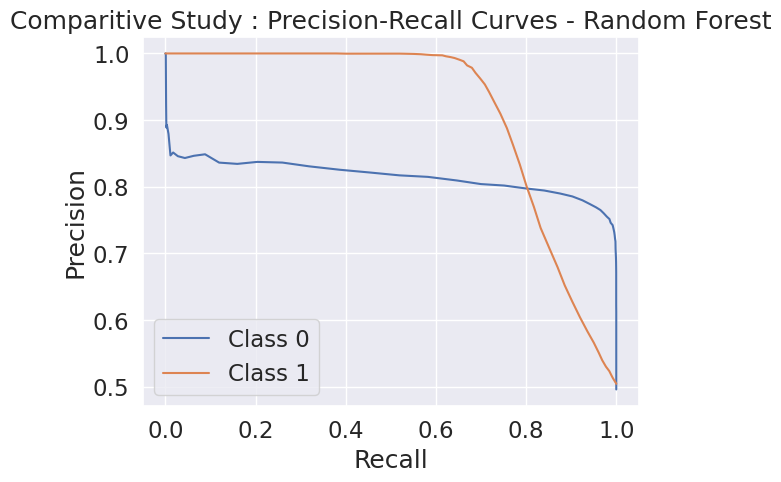

In [139]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# Get the probabilities for each class
probas =random_forest.predict_proba(X_best_test)

# Compute precision and recall for class 0 (<= 50K)
precision_0, recall_0, _ = precision_recall_curve(y_best_test, probas[:, 0], pos_label=0)

# Compute precision and recall for class 1 (>= 50K)
precision_1, recall_1, _ = precision_recall_curve(y_best_test, probas[:, 1], pos_label=1)

# Plot precision-recall curves
plt.plot(recall_0, precision_0, label='Class 0')
plt.plot(recall_1, precision_1, label='Class 1')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Comparitive Study : Precision-Recall Curves - Random Forest')
plt.legend()
plt.grid(True)
plt.show()

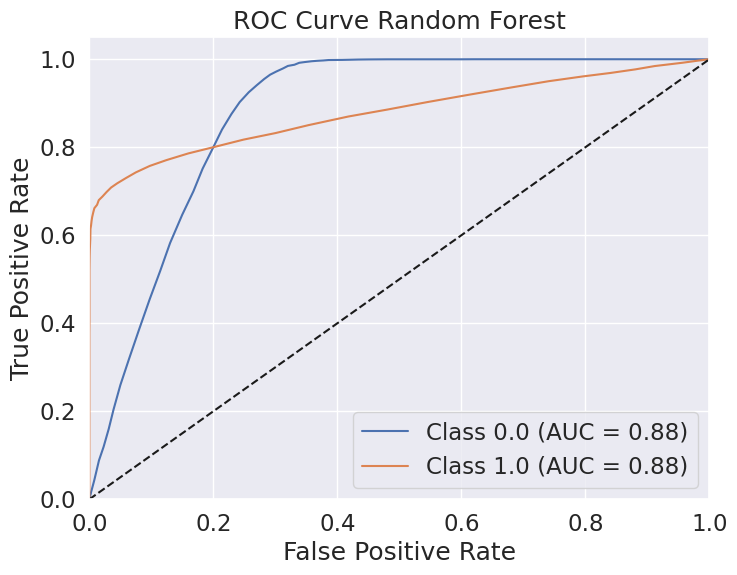

In [141]:
from sklearn.metrics import roc_curve, auc

# Get the predicted probabilities for each class
probas = random_forest.predict_proba(X_best_test)

# Compute the ROC curve for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(random_forest.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_best_test, probas[:, i], pos_label=random_forest.classes_[i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(random_forest.classes_)):
    plt.plot(fpr[i], tpr[i], label=f'Class {random_forest.classes_[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Plot the diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Random Forest')
plt.legend()
plt.grid(True)
plt.show()

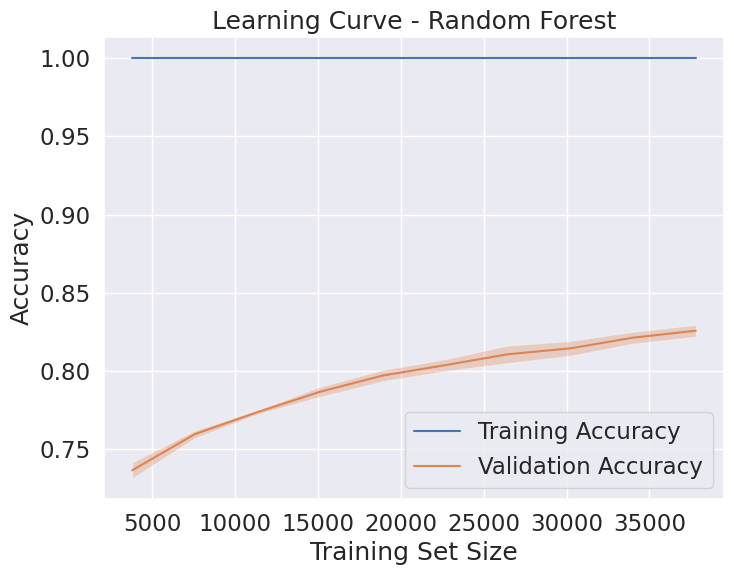

In [142]:
from sklearn.model_selection import learning_curve

# Define the training sizes for the learning curve
train_sizes, train_scores, test_scores = learning_curve(
    random_forest, X_best_train, y_best_train, cv=5, scoring='accuracy', train_sizes=np.linspace(0.1, 1.0, 10))

# Calculate the mean and standard deviation of the training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_scores_mean, label='Training Accuracy')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.3)
plt.plot(train_sizes, test_scores_mean, label='Validation Accuracy')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.3)
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve - Random Forest')
plt.legend()
plt.grid(True)
plt.show()